# Setting

In [1]:
SCOPETYPE = 'OPENADC'
PLATFORM = 'CWLITEXMEGA'
CRYPTO_TARGET='TINYAES128C'
SS_VER = 'SS_VER_1_1'

In [2]:
%run "../Setup_Scripts/Setup_Generic.ipynb"

INFO: Found ChipWhisperer😍


## Add an Trigger to help Capture Trace

In [4]:
%%bash -s "$PLATFORM" "$CRYPTO_TARGET" "$SS_VER"
cd ../../hardware/victims/firmware/simpleserial-aes-nchu
make PLATFORM=$1 CRYPTO_TARGET=$2 SS_VER=$3

Building for platform CWLITEXMEGA with CRYPTO_TARGET=TINYAES128C
SS_VER set to SS_VER_1_1
Blank crypto options, building for AES128
C:/Users/GC_Lu/CHIPWH~1/cw/home/portable/avrgcc/bin/make clean_objs .dep 
make[1]: Entering directory 'C:/Users/GC_Lu/ChipWhisperer5_64/cw/home/portable/chipwhisperer/hardware/victims/firmware/simpleserial-aes-nchu'
Building for platform CWLITEXMEGA with CRYPTO_TARGET=TINYAES128C
SS_VER set to SS_VER_1_1
Blank crypto options, building for AES128
rm -f -- simpleserial-aes-CWLITEXMEGA.hex
rm -f -- simpleserial-aes-CWLITEXMEGA.eep
rm -f -- simpleserial-aes-CWLITEXMEGA.cof
rm -f -- simpleserial-aes-CWLITEXMEGA.elf
rm -f -- simpleserial-aes-CWLITEXMEGA.map
rm -f -- simpleserial-aes-CWLITEXMEGA.sym
rm -f -- simpleserial-aes-CWLITEXMEGA.lss
rm -f -- objdir-CWLITEXMEGA/*.o
rm -f -- objdir-CWLITEXMEGA/*.lst
rm -f -- simpleserial-aes.s simpleserial.s XMEGA_AES_driver.s uart.s usart_driver.s xmega_hal.s aes.s aes-independant.s
rm -f -- simpleserial-aes.d simpleserial

In [6]:
cw.program_target(scope, cw.programmers.XMEGAProgrammer, "../../hardware/victims/firmware/simpleserial-aes-nchu/simpleserial-aes-CWLITEXMEGA.hex")

XMEGA Programming flash...
XMEGA Reading flash...
Verified flash OK, 4195 bytes


# Only Capture Key Expansion

In [7]:
def key_expan_pass_trace(key):
    reset_target(scope)

    scope.arm()
    target.simpleserial_write('k', key)
    target.simpleserial_wait_ack()
    
    ret = scope.capture()
    
    if ret:
        print('Timeout happened during acquisition')

    trace = scope.get_last_trace()
    return trace

### 在執行過程中抓取樣本10000次

In [10]:
scope.adc.samples = 24400

### 測試與觀察在不同hamming weight上的

[ 0.09863281 -0.27441406 -0.11523438 ... -0.16992188 -0.02441406
 -0.0546875 ]


<IPython.core.display.Javascript object>


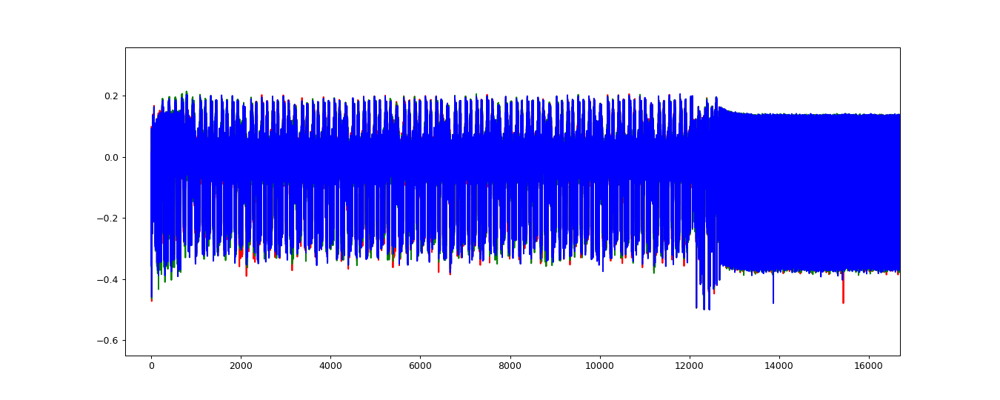

In [11]:
#Setting three array to compare and test it is working.

zero_array = bytearray([0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00,0x00])
one_array =  bytearray([0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff,0xff])
helf_array = bytearray([0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f,0x0f])


trace_h = key_expan_pass_trace( zero_array )
trace_z = key_expan_pass_trace( one_array )
trace_y = key_expan_pass_trace( helf_array )

print(trace_h)

%matplotlib notebook
import matplotlib.pylab as plt

plt.figure(figsize=(15, 6))
plt.plot(trace_h, 'r')
plt.plot(trace_z, 'g')
plt.plot(trace_y, 'b')
plt.show()


In [16]:
print(zero_array)

bytearray(b'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00')


## Random Generate Key

In [13]:
ktp = cw.ktp.Basic()
key, text = ktp.next()
ktp.fixed_key=False

## Capture Trace

In [14]:
from tqdm.notebook import tnrange
import numpy as np
import time

trace_array = []
key_array = []

N=1000
for i in tnrange(N, desc='Capturing traces'):
    key_array.append(key)
    
    trace_array.append(key_expan_pass_trace(key))
    
    key, text = ktp.next()

Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

## Create an project to save data

In [102]:
proj_path = "../projects/KeyExpansion_SPA_project_ktp"

### Option:
- First time Creat
- Next time Open
- The Project will store the Object Trace, the Trace include:
    1. key 
    2. textin 
    3. textout
    4. power wave

In [93]:
# proj = cw.create_project(proj_path)
proj = cw.open_project(proj_path)

### Store Trace into project

In [203]:
for i in tnrange(len(trace_array), desc='proj save'):
    trace = cw.Trace(trace_array[i], 'no_textin', 'no_textout', key_array[i])
    proj.traces.append(trace)

proj save:   0%|          | 0/10000 [00:00<?, ?it/s]

### Take out the trace from project

In [103]:
# initialize
trace_array=[]
key_array=[]

for i in tnrange(len(proj.waves), desc='proj save'):
    trace_array.append(proj.waves[i])
    key_array.append(bytearray(proj.keys[i]))

proj save:   0%|          | 0/10000 [00:00<?, ?it/s]

In [15]:
for key in key_array:
    print(key)

CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'a7 e5 98 4e 21 52 e8 ae 13 d3 1e 3e 42 7d 72 40')
CWbytearray(b'e4 74 63 18 39 00 65 5e 87 ba 03 d8 4e 0b f4 8f')
CWbytearray(b'dc ab 08 ff af 29 2b 02 34 1c 1d 1c 31 02 10 38')
CWbytearray(b'ed 8f 1a d2 3b f8 b5 71 2e 79 ef df 68 e6 3f a4')
CWbytearray(b'd2 4e de 6d 6d 3f 8f b0 37 e5 51 c2 0f 76 d7 e3')
CWbytearray(b'89 69 84 70 3e 2b 7c 13 f5 ca 9b 97 0b 9c 39 89')
CWbytearray(b'da 5c b0 f8 1d cb 8b 80 5e 18 38 b3 7f 00 0c 0b')
CWbytearray(b'ec e9 61 64 23 65 60 87 f2 10 2b 5c 5c c5 c0 88')
CWbytearray(b'1e 6e 49 10 cf 65 64 ec ec 27 35 f2 a3 08 01 f8')
CWbytearray(b'99 6a 1e 05 56 5c 8f f8 1f d2 1d af 85 9c cd 01')
CWbytearray(b'51 24 4e 1f 80 f7 d8 d1 80 d4 d6 b2 d4 bd a8 41')
CWbytearray(b'c2 2c ca 0d c2 63 cd 93 89 d8 05 63 7f 03 d8 67')
CWbytearray(b'bd bc a9 c0 fa 11 a6 f2 ee fb c3 6f b2 0f bc 09')
CWbytearray(b'a8 a9 b4 cf c9 8c 4f 0e 4b 5a 43 a3 5a 8e 6e a1')
CWbytearray(b'1d 9e aa 79 6c 24 43 29 25

In [104]:
len(key_array)

10000

<IPython.core.display.Javascript object>


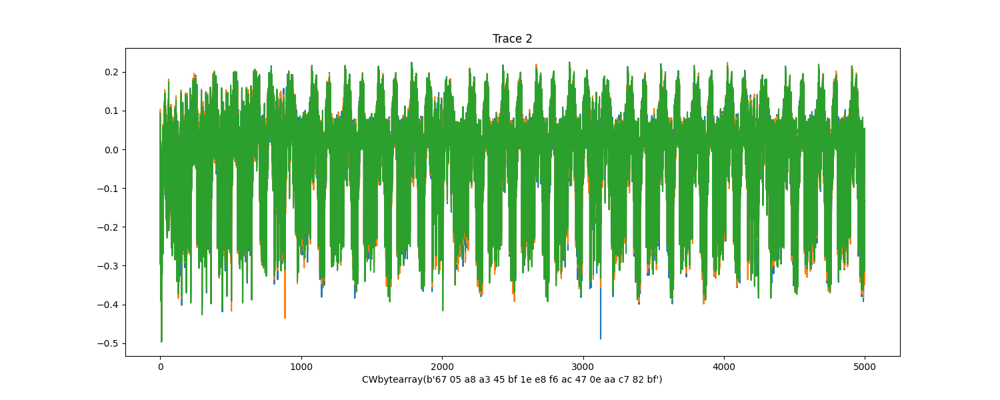

In [68]:
%matplotlib notebook
import matplotlib.pylab as plt

fig = plt.figure(figsize=(15, 6))

i=0
for trace in proj.waves:
    plt.title(f"Trace {i}")
    plt.xlabel(key_array[i])
    plt.plot(trace)
    i=i+1
    
    if i == 3:
        break;
    fig.canvas.draw()
    
plt.savefig(f'./img/key_exp.png')

<IPython.core.display.Javascript object>


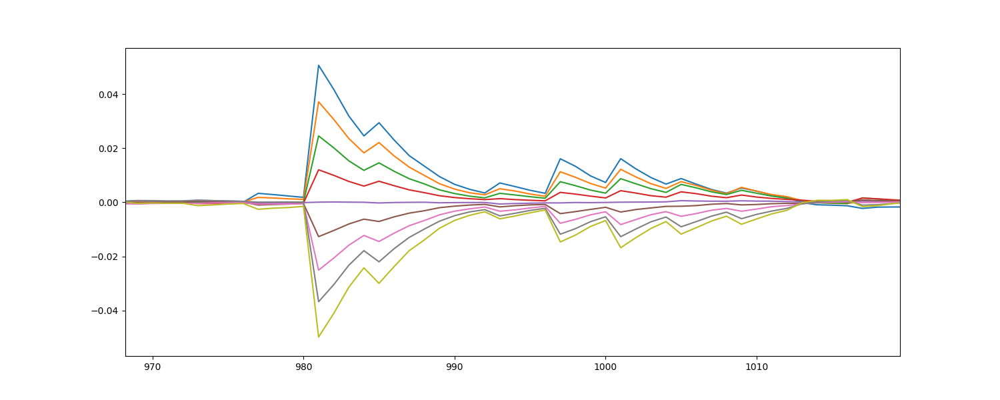

In [108]:
import time

hw_groups = [[], [], [], [], [], [], [], [], []]

for tnum in range(len(trace_array)):
#     print(key_array[tnum][0])
    hw_of_byte = HW[key_array[tnum][0]]
    hw_groups[hw_of_byte].append(trace_array[tnum])
    
hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
avg_trace = np.average(hw_averages, axis=0)

fig = plt.figure(figsize=(15, 6))

for hw in range(9):
    time.sleep(0.5)
    plt.plot(hw_averages[hw]-avg_trace)
    fig.canvas.draw()

In [348]:
for i in range(9):
    print(len(hw_groups[i]))

3
28
105
212
282
229
104
33
4


In [106]:
key_exp_loc = np.argmax(abs(hw_averages[8]-avg_trace))
key_exp_loc

981

<IPython.core.display.Javascript object>


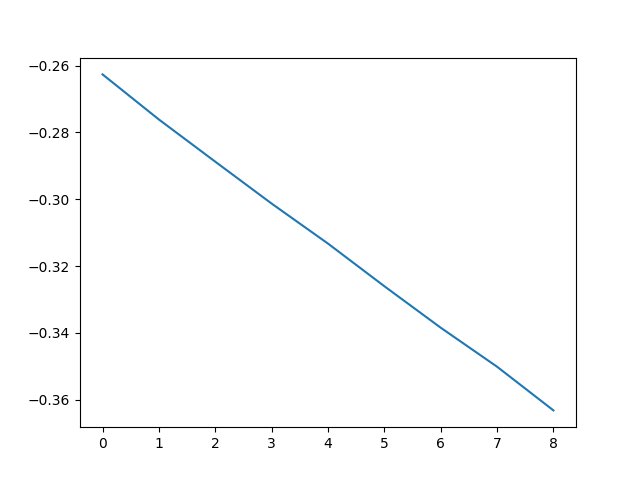

In [107]:
fig = plt.figure()

plt.plot(hw_averages[:,key_exp_loc])
plt.show()

## Generated Key

使用hamming weight 1 2 3 4，隨機選擇組合去生成key

In [351]:
import random

candidate_keypart=bytearray([0x0, 0x1, 0x3, 0x7, 0xf])
def key_gen():
    temp_key=bytearray([])
    for i in range(16):
        temp_key.append((random.choice(candidate_keypart))*16+random.choice(candidate_keypart))
        
    return temp_key


key_gen()

CWbytearray(b'00 f7 3f 70 07 ff 30 73 3f 03 31 33 70 11 ff 37')

In [223]:
key = key_gen()
trace_array = []
key_array = []

N=1000
for i in tnrange(N, desc='Capturing traces'):
    key_array.append(key)
    
    trace_array.append(cw.capture_trace(scope, target, text, key))
    
    key=key_gen()
    _, text = ktp.next()
    

Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

## Save Data

In [109]:
proj_path = "../projects/KeyExpansion_SPA_project_formatkey3"

# proj = cw.create_project(proj_path)
proj = cw.open_project(proj_path)

In [331]:
for i in tnrange(len(trace_array), desc='proj save'):
    trace = cw.Trace(trace_array[i], 'no_textin', 'no_textout', key_array[i])
    proj.traces.append(trace)

proj save:   0%|          | 0/1000 [00:00<?, ?it/s]

In [335]:
proj.save()

## Take out data

In [110]:
# initialize
trace_array=[]
key_array=[]

for i in tnrange(len(proj.waves), desc='proj take'):
    trace_array.append(proj.waves[i])
    key_array.append(bytearray(proj.keys[i]))

proj take:   0%|          | 0/10000 [00:00<?, ?it/s]

In [369]:
len(proj.waves)

10000

<IPython.core.display.Javascript object>


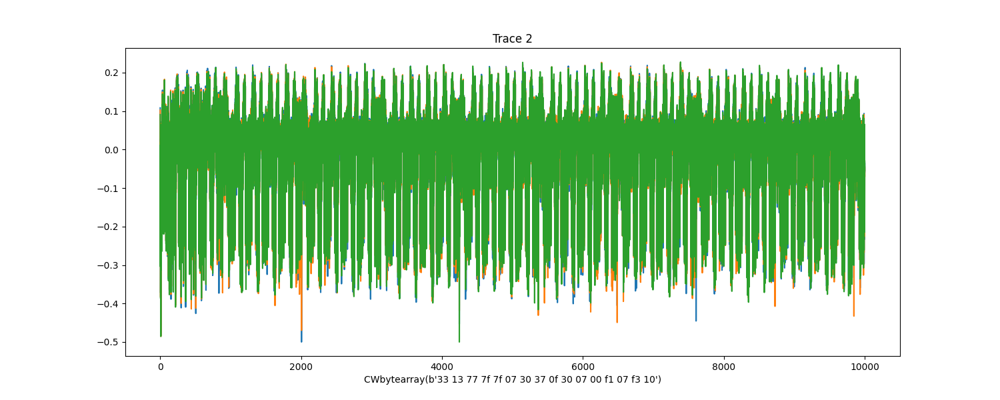

In [51]:
fig = plt.figure(figsize=(15, 6))

i=0
for trace in proj.waves:
    plt.title(f"Trace {i}")
    plt.xlabel(key_array[i])
    plt.plot(trace)
    i=i+1
    
    if i == 3:
        break;
    fig.canvas.draw()

<IPython.core.display.Javascript object>


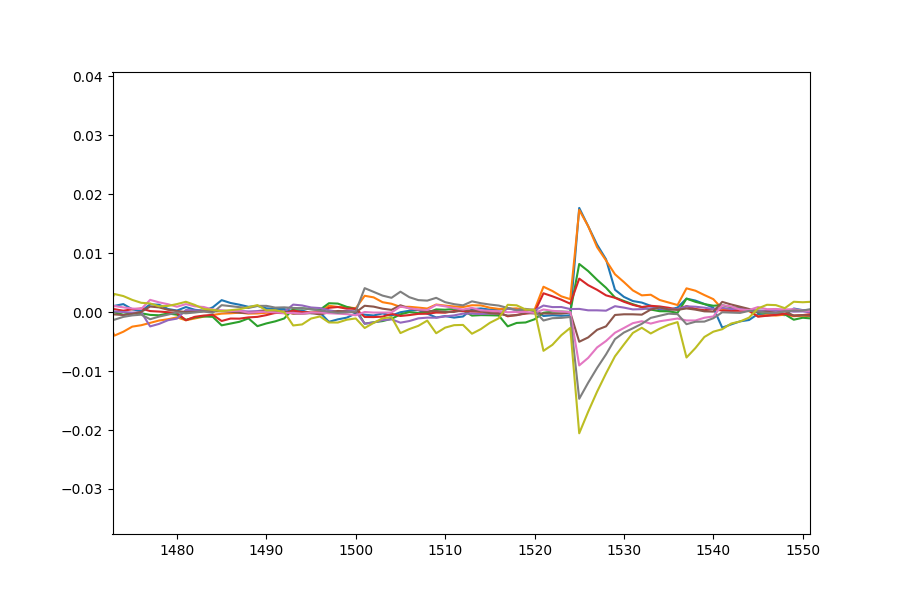

In [89]:
fig = plt.figure(figsize=(9, 6))

<IPython.core.display.Javascript object>


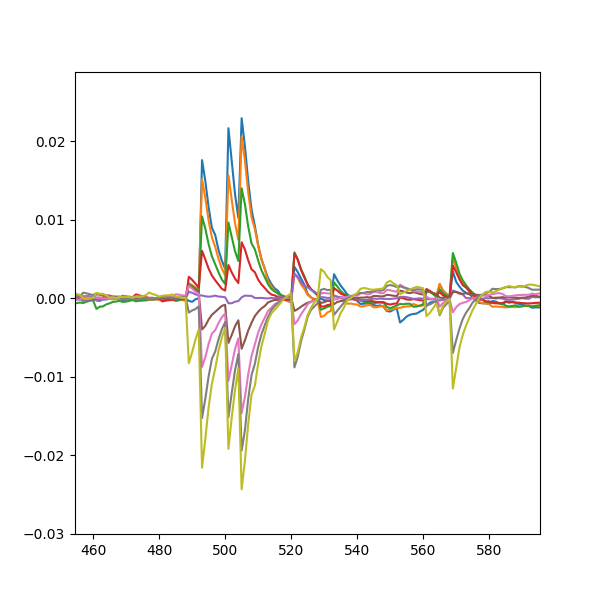

In [111]:
import time

hw_groups = [[], [], [], [], [], [], [], [], []]

for tnum in range(len(trace_array)):
#     print(key_array[tnum][0])
    hw_of_byte = HW[key_array[tnum][11]]
    hw_groups[hw_of_byte].append(trace_array[tnum])
    
hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
avg_trace = np.average(hw_averages, axis=0)

fig = plt.figure(figsize=(6, 6))

for hw in range(9):
    time.sleep(0.5)
    plt.plot(hw_averages[hw]-avg_trace)
    fig.canvas.draw()
    
# plt.savefig(f'./img/test.png')

In [372]:
for i in range(9):
    print(len(hw_groups[i]))

42
75
125
173
221
138
136
60
30


In [112]:
key_exp_loc = np.argmax(abs(hw_averages[8]-avg_trace))
key_exp_loc

1637

<IPython.core.display.Javascript object>


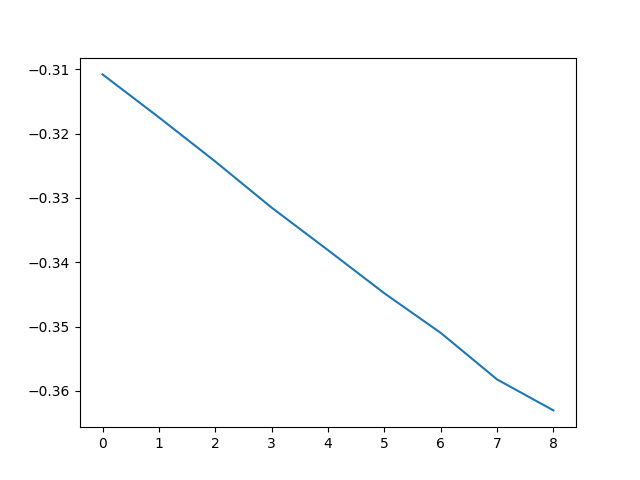

In [113]:
fig = plt.figure()

plt.plot(hw_averages[:,key_exp_loc])
plt.show()

# Capture Full Trace

## Capture Random key

In [ ]:
ktp=cw.ktp.Basic()
ktp.fixed_key=False
key, text=ktp.next()
trace_array = []
key_array = []

N=1000
for i in tnrange(N, desc='Capturing traces'):
    key_array.append(key)
    
    trace_array.append(cw.capture_trace(scope, target, text, key))
    
    key, text=ktp.next()

## Save Data

In [116]:
proj_path = "../projects/KeyExpansion_SPA_project_randomkey_fulltrace"

# proj = cw.create_project(proj_path)
proj = cw.open_project(proj_path)

In [ ]:
for i in tnrange(len(trace_array), desc='proj save'):
    trace = cw.Trace(trace_array[i], 'no_textin', 'no_textout', key_array[i])
    proj.traces.append(trace)
    
proj.save()

## Take out Data

In [117]:
# initialize
trace_array=[]
key_array=[]

for i in tnrange(len(proj.waves), desc='proj take'):
    trace_array.append(proj.waves[i])
    key_array.append(bytearray(proj.keys[i]))

proj take:   0%|          | 0/100000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


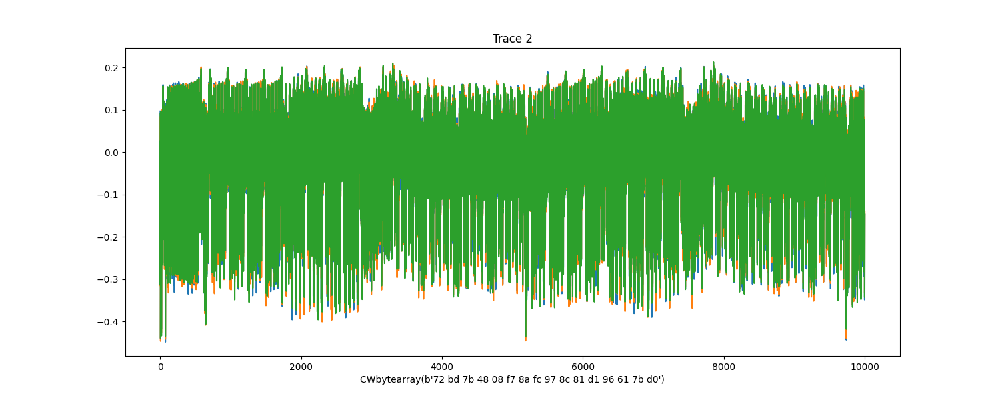

In [63]:
fig = plt.figure(figsize=(15, 6))

i=0
for trace in proj.waves:
    plt.title(f"Trace {i}")
    plt.xlabel(key_array[i])
    plt.plot(trace)
    i=i+1
    
    if i == 3:
        break;
    fig.canvas.draw()
    
plt.savefig(f'./img/test.png')

## 1000 筆資料

<IPython.core.display.Javascript object>


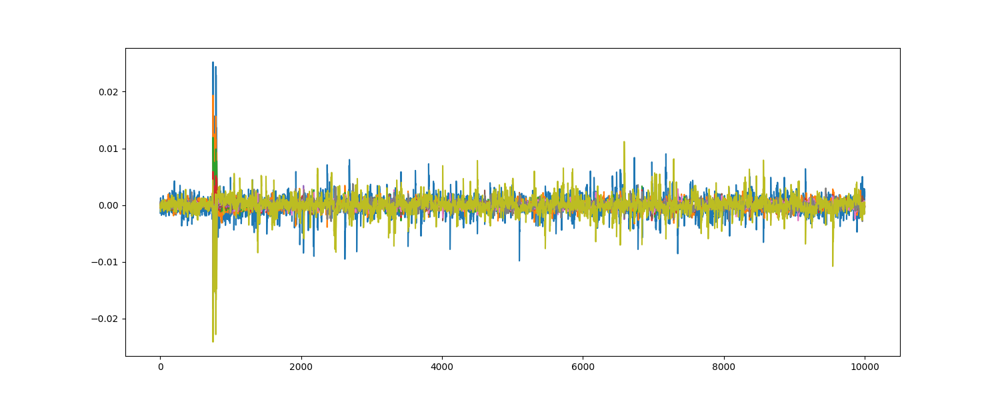

In [122]:
import matplotlib.pylab as plt

hw_groups = [[], [], [], [], [], [], [], [], []]

for tnum in range(len(trace_array)):
#     print(key_array[tnum][0])
    hw_of_byte = HW[key_array[tnum][0]]
    hw_groups[hw_of_byte].append(trace_array[tnum])
    
hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
avg_trace = np.average(hw_averages, axis=0)

fig = plt.figure(figsize=(15, 6))

for hw in range(9):
    time.sleep(0.5)
    plt.plot(hw_averages[hw]-avg_trace)
    fig.canvas.draw()
    


proj take:   0%|          | 0/1000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


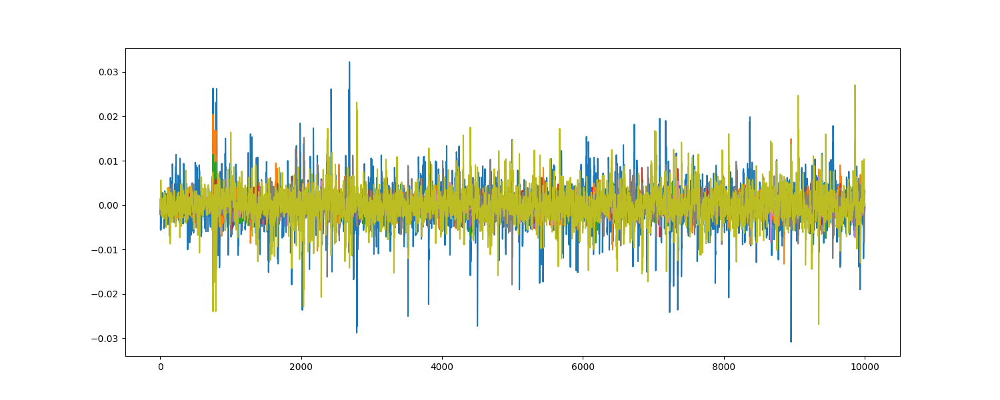

proj take:   0%|          | 0/2000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


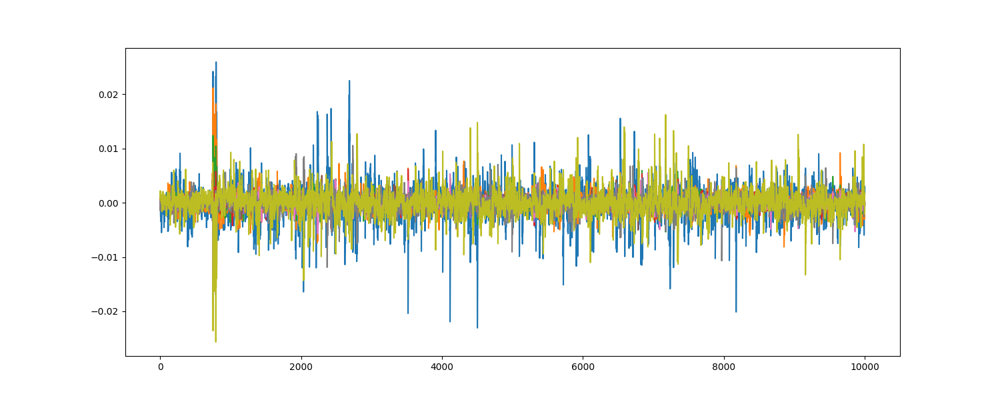

proj take:   0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


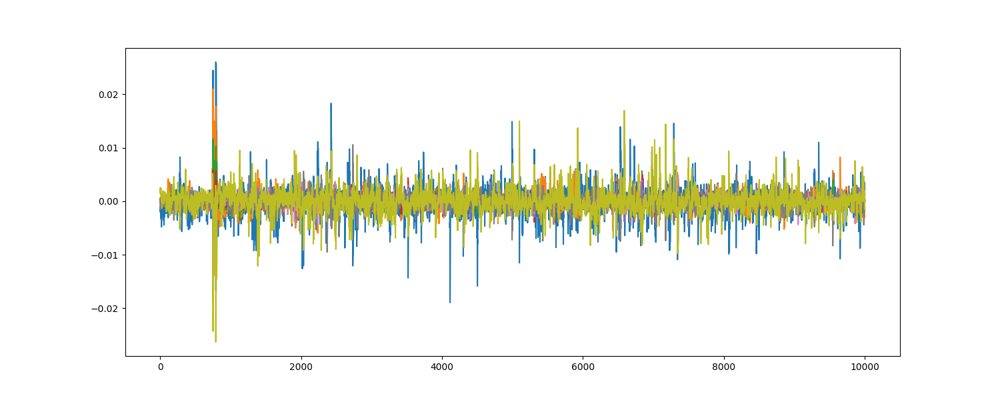

proj take:   0%|          | 0/4000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


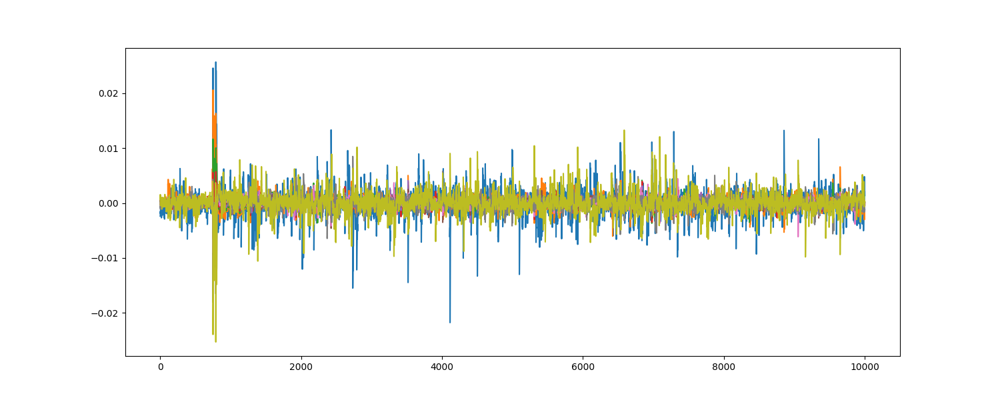

proj take:   0%|          | 0/5000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


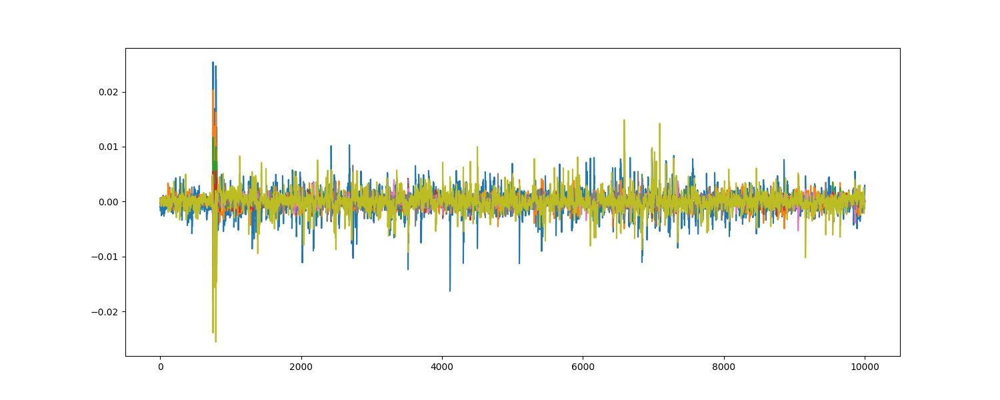

proj take:   0%|          | 0/6000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


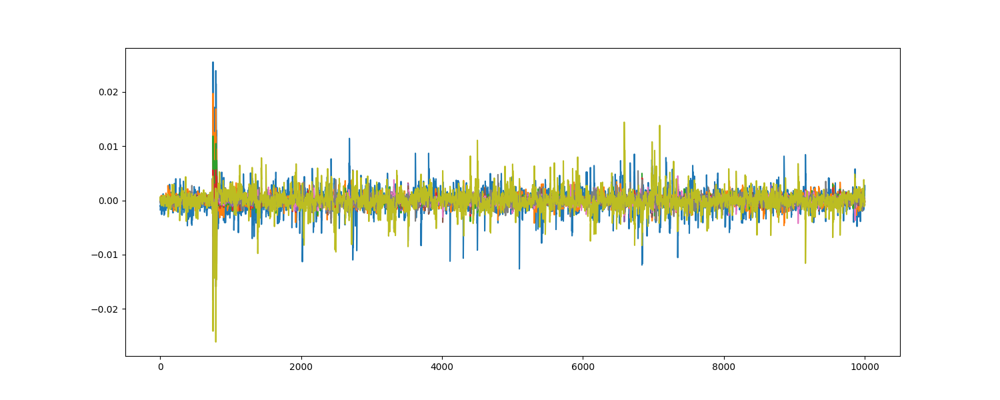

proj take:   0%|          | 0/7000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


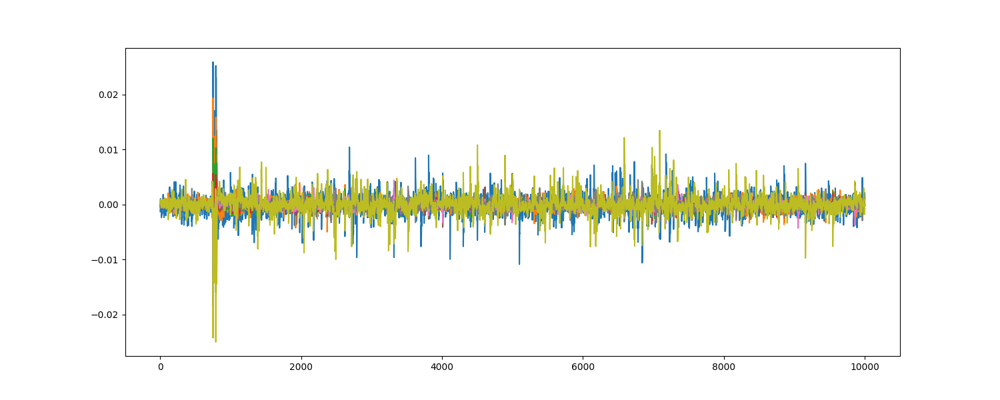

proj take:   0%|          | 0/8000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


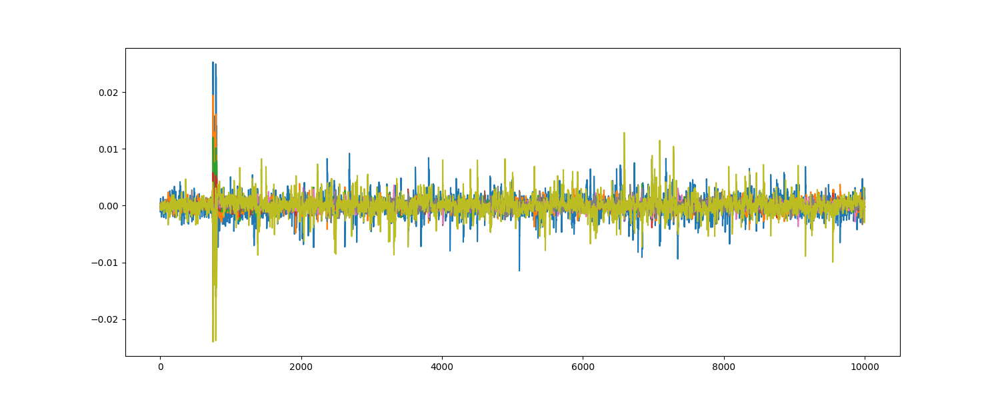

proj take:   0%|          | 0/9000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


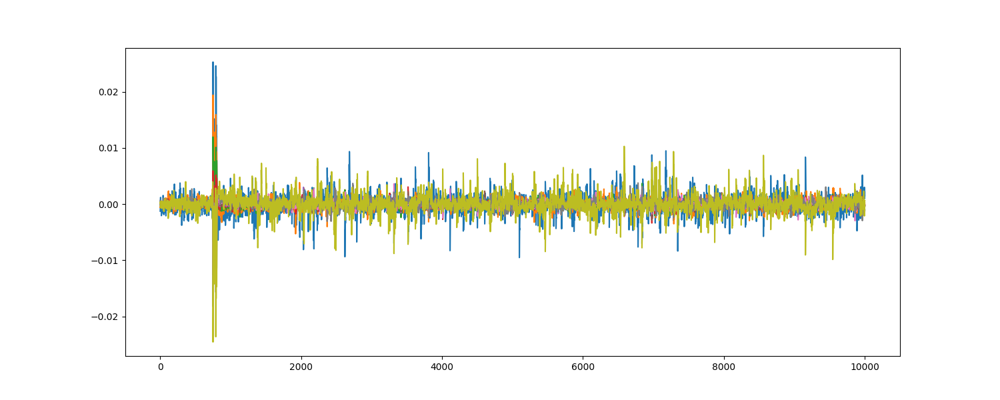

proj take:   0%|          | 0/10000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


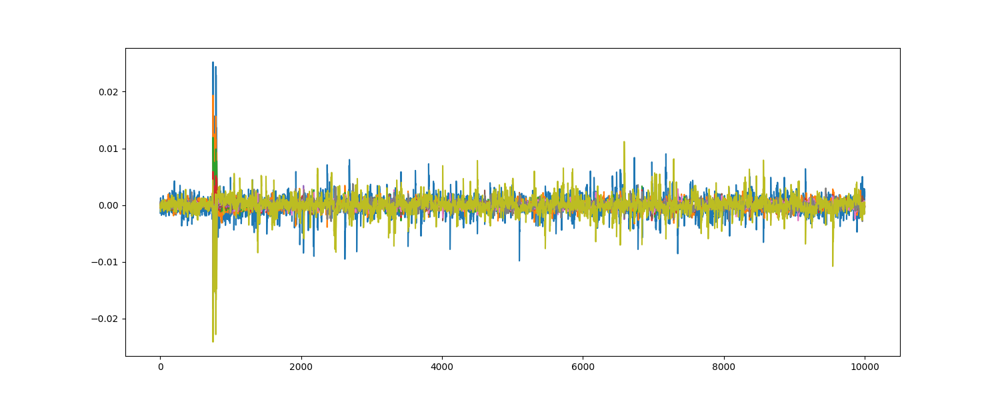

In [379]:
for i in range(10):
    # initialize
    trace_array=[]
    key_array=[]
    
    n=1000+1000*i

    for i in tnrange(len(proj.waves[:n]), desc='proj take'):
        trace_array.append(proj.waves[i])
        key_array.append(bytearray(proj.keys[i]))
        
    hw_groups = [[], [], [], [], [], [], [], [], []]

    for tnum in range(len(trace_array)):
    #     print(key_array[tnum][0])
        hw_of_byte = HW[key_array[tnum][0]]
        hw_groups[hw_of_byte].append(trace_array[tnum])

    hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
    avg_trace = np.average(hw_averages, axis=0)

    fig = plt.figure(figsize=(15, 6))

    for hw in range(9):
        time.sleep(0.5)
        plt.plot(hw_averages[hw]-avg_trace)
        fig.canvas.draw()

In [123]:
key_exp_loc = np.argmax(abs(hw_averages[8]-avg_trace))
key_exp_loc

749

<IPython.core.display.Javascript object>


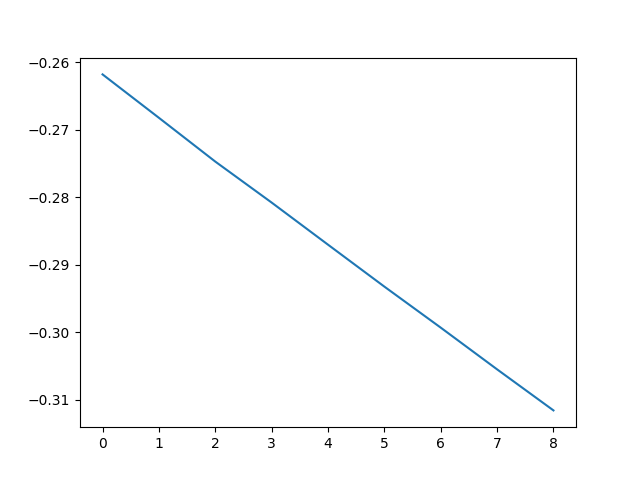

In [409]:
fig = plt.figure()

plt.plot(hw_averages[:,key_exp_loc])
plt.show()

## Capture with key select method 

In [ ]:
key = key_gen()
trace_array = []
key_array = []

N=10000
for i in tnrange(N, desc='Capturing traces'):
    key_array.append(key)
    
    trace_array.append(cw.capture_trace(scope, target, text, key))
    
    key=key_gen()
    _, text = ktp.next()

## Data Save

In [120]:
proj_path = "../projects/KeyExpansion_SPA_project_formatkey_fulltrace"

# proj = cw.create_project(proj_path)
proj = cw.open_project(proj_path)

In [ ]:
for i in tnrange(len(trace_array), desc='proj save'):
    trace = cw.Trace(trace_array[i], 'no_textin', 'no_textout', key_array[i])
    proj.traces.append(trace)
    
proj.save()

## Take out Data

In [121]:
# initialize
trace_array=[]
key_array=[]

for i in tnrange(len(proj.waves), desc='proj take'):
    trace_array.append(proj.waves[i])
    key_array.append(bytearray(proj.keys[i]))

proj take:   0%|          | 0/10000 [00:00<?, ?it/s]

In [414]:
len(proj.waves)

10000

proj take:   0%|          | 0/1000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


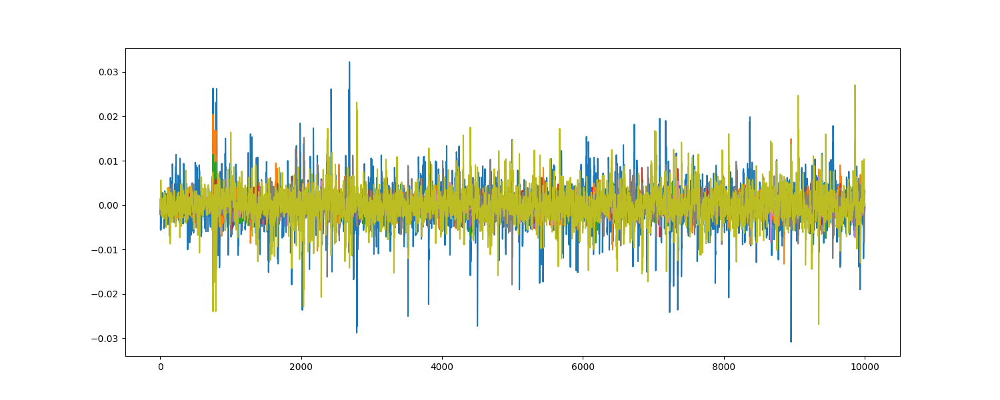

proj take:   0%|          | 0/2000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


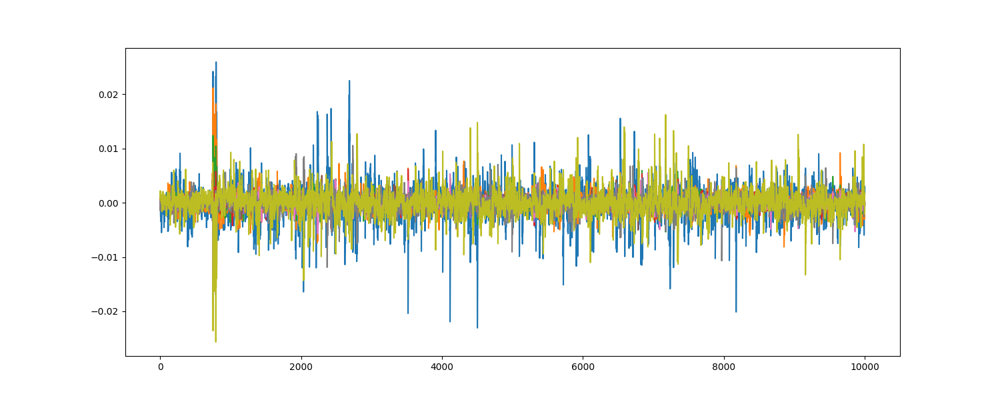

proj take:   0%|          | 0/3000 [00:00<?, ?it/s]

C:\Users\GC_Lu\CHIPWH~1\cw\home\portable\WPy64-3771\python-3.7.7.amd64\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


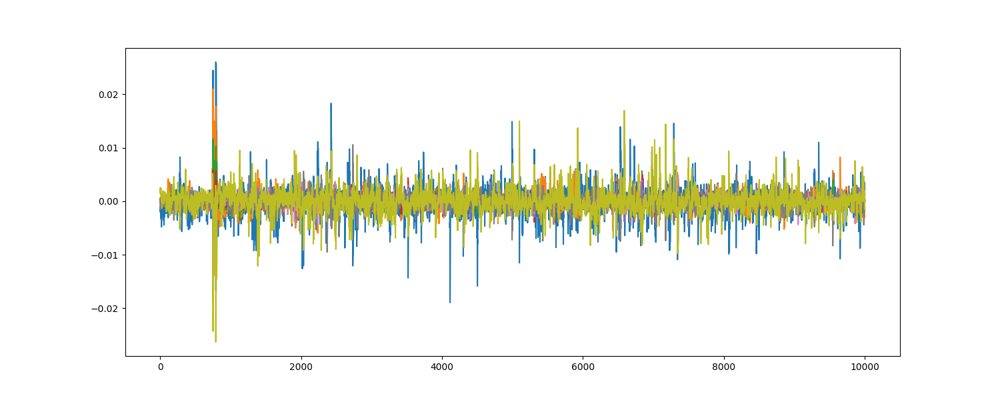

proj take:   0%|          | 0/4000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


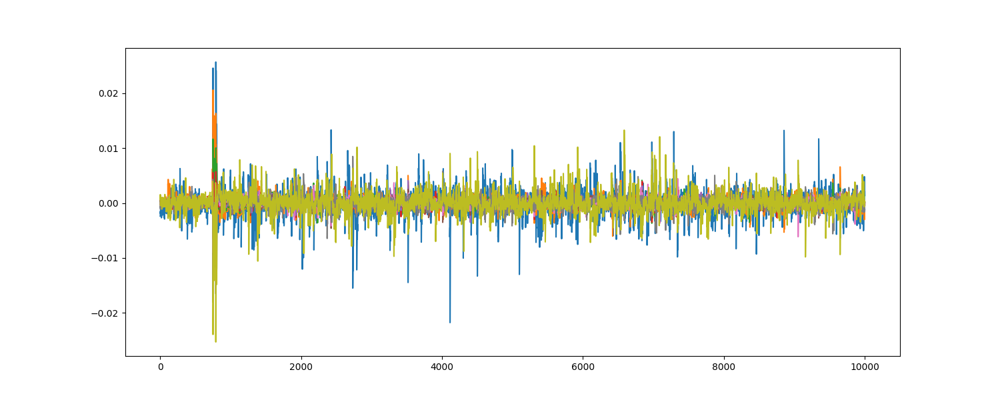

proj take:   0%|          | 0/5000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


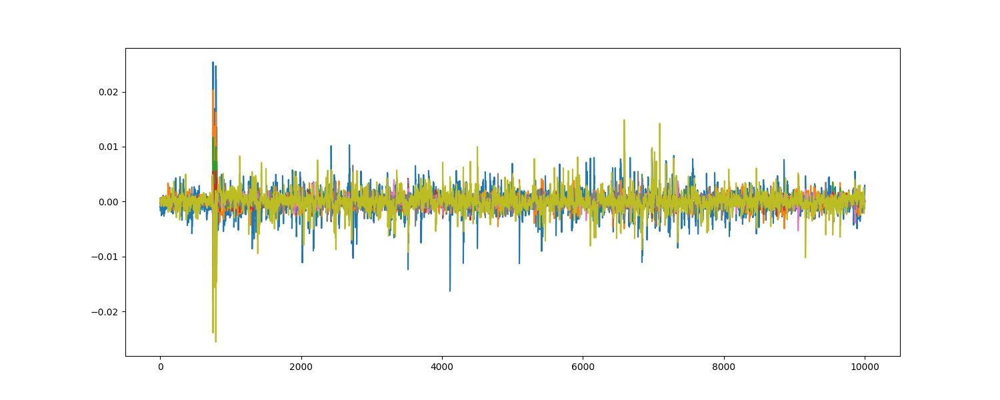

proj take:   0%|          | 0/6000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


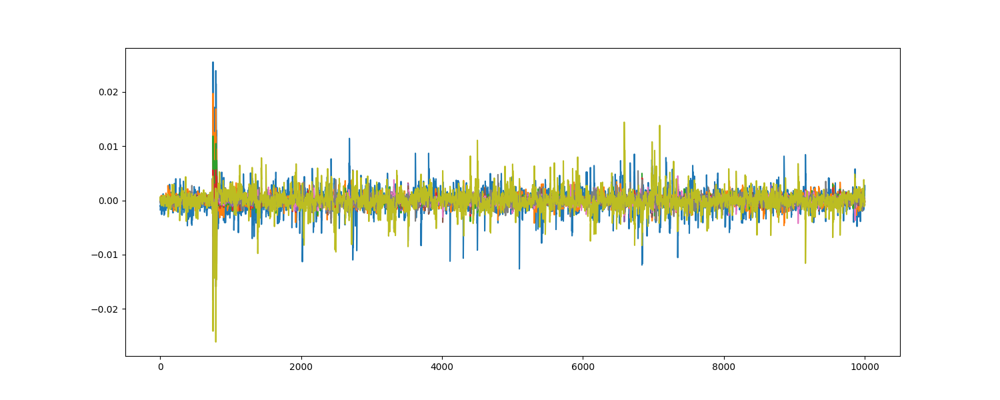

proj take:   0%|          | 0/7000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


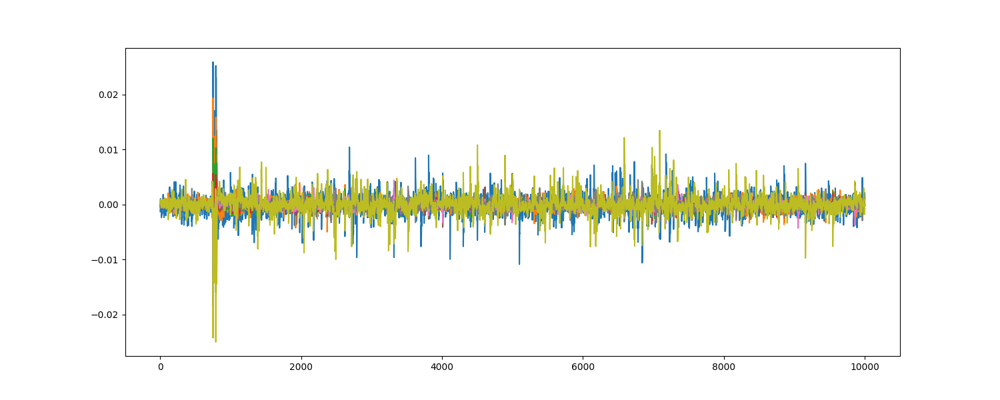

proj take:   0%|          | 0/8000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


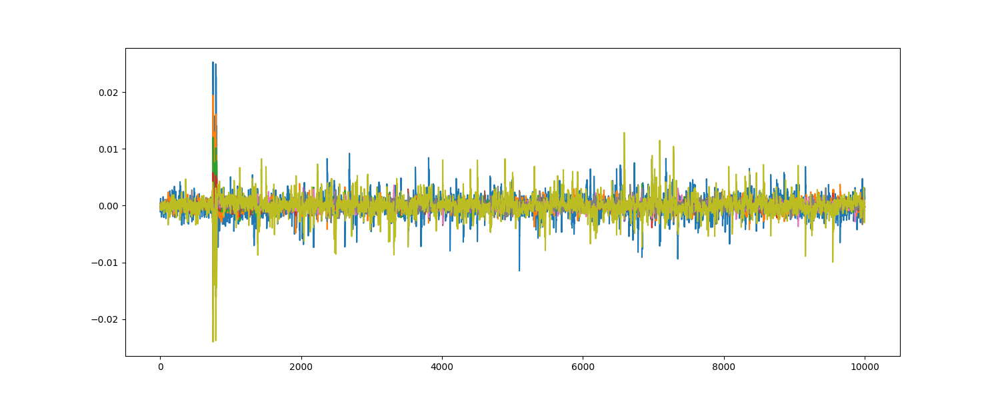

proj take:   0%|          | 0/9000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


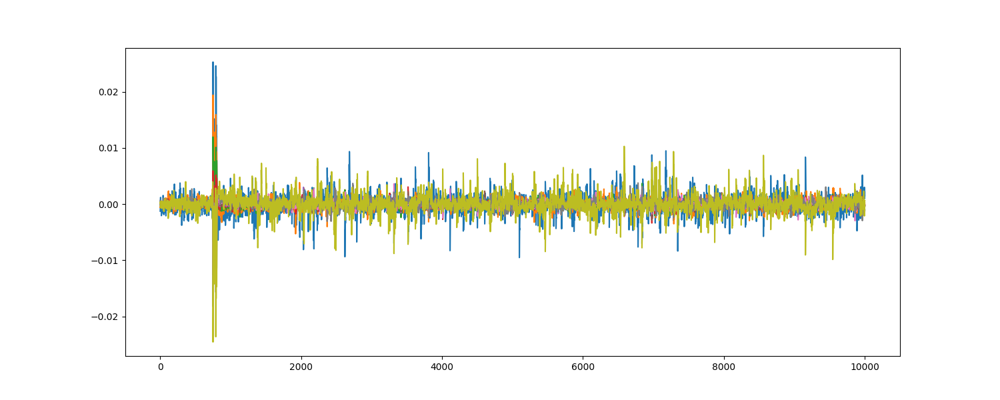

proj take:   0%|          | 0/10000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


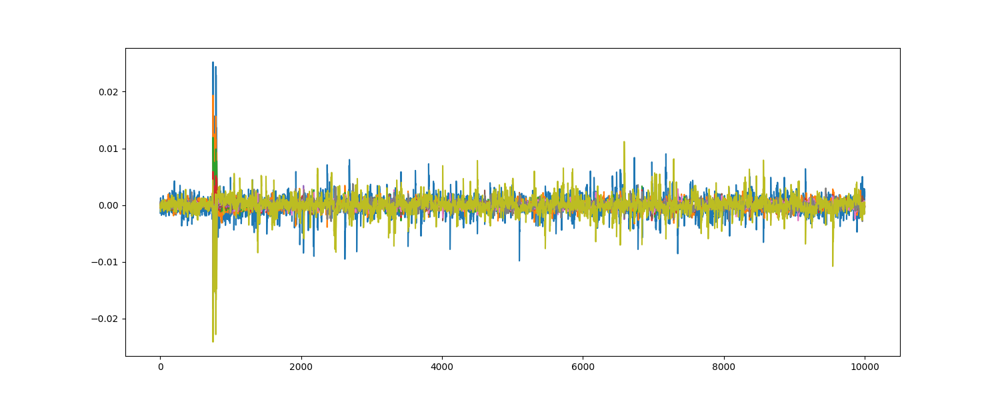

In [383]:
for i in range(10):
    # initialize
    trace_array=[]
    key_array=[]
    
    n=1000+1000*i

    for i in tnrange(len(proj.waves[:n]), desc='proj take'):
        trace_array.append(proj.waves[i])
        key_array.append(bytearray(proj.keys[i]))
        
    hw_groups = [[], [], [], [], [], [], [], [], []]

    for tnum in range(len(trace_array)):
    #     print(key_array[tnum][0])
        hw_of_byte = HW[key_array[tnum][0]]
        hw_groups[hw_of_byte].append(trace_array[tnum])

    hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
    avg_trace = np.average(hw_averages, axis=0)

    fig = plt.figure(figsize=(15, 6))

    for hw in range(9):
        time.sleep(0.5)
        plt.plot(hw_averages[hw]-avg_trace)
        fig.canvas.draw()

In [416]:
key_exp_loc = np.argmax(abs(hw_averages[8]-avg_trace))
key_exp_loc

749

<IPython.core.display.Javascript object>


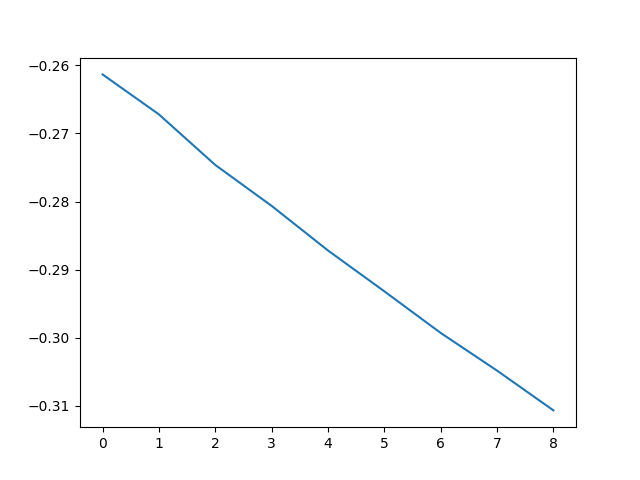

In [417]:
fig = plt.figure()

plt.plot(hw_averages[:,key_exp_loc])
plt.show()

# Trace Victim

In [7]:
ktp = cw.ktp.Basic()
key, text = ktp.next()

## Only capture key expansion

In [8]:
from tqdm.notebook import tnrange
import numpy as np
import time

trace_array = []
key_array = []

N=3000
for i in tnrange(N, desc='Capturing traces'):
    key_array.append(key)
    
    trace_array.append(key_expan_pass_trace(key))
    
    key, text = ktp.next()

Capturing traces:   0%|          | 0/3000 [00:00<?, ?it/s]

In [9]:
for key in key_array:
    print(key)

CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab

CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab

## Save an Take data

In [29]:
proj_path = "../projects/KeyExpansion_SPA_project_victim_onlykeyexp"

# proj = cw.create_project(proj_path)
proj = cw.open_project(proj_path)

In [11]:
for i in tnrange(len(trace_array), desc='proj save'):
    trace = cw.Trace(trace_array[i], 'no_textin', 'no_textout', key_array[i])
    proj.traces.append(trace)
    
proj.save()

proj save:   0%|          | 0/3000 [00:00<?, ?it/s]

## Take out Data

In [30]:
# initialize
trace_array=[]
key_array=[]

for i in tnrange(len(proj.waves), desc='proj take'):
    trace_array.append(proj.waves[i])
    key_array.append(bytearray(proj.keys[i]))

proj take:   0%|          | 0/3000 [00:00<?, ?it/s]

In [36]:
print(proj.traces[0].textin)
len(proj.waves)

no_textin


3000

## Capture full trace

In [12]:
ktp=cw.ktp.Basic()
key, text=ktp.next()
trace_array = []
key_array = []

N=3000
for i in tnrange(N, desc='Capturing traces'):
    key_array.append(key)
    
    trace_array.append(cw.capture_trace(scope, target, text, key))
    
    key, text=ktp.next()

Capturing traces:   0%|          | 0/3000 [00:00<?, ?it/s]

In [14]:
for key in key_array:
    print(key)

CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab

CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab

In [19]:
print(len(trace_array))

3000


In [22]:
len(trace_array[0])

4

In [24]:
len(proj.waves)

0

In [26]:
proj_path = "../projects/KeyExpansion_SPA_project_victim_full"

proj = cw.create_project(proj_path)
# proj = cw.open_project(proj_path)

In [27]:
for i in tnrange(len(trace_array), desc='proj save'):
    proj.traces.append(trace_array[i])
    
proj.save()

proj save:   0%|          | 0/3000 [00:00<?, ?it/s]

# Analysis

## Calculate the Hamming Weight

In [58]:
HW = [bin(n).count("1") for n in range(0, 256)]
HW[0xff]

8

## Round Key Generation

In [114]:
from chipwhisperer.analyzer import aes_funcs

round_key=[]



for key in key_array:
    temp_roundkey=[]
    for i in range(11):
        temp = aes_funcs.key_schedule_rounds(key, 11, i)
        temp_intern_roundkey=[]
        for j in temp:
            temp_intern_roundkey.append(j)
        temp_roundkey.append(temp_intern_roundkey)
        
    round_key.append(temp_roundkey)
    
len(round_key)

10000

In [396]:
import pandas as pd


print(key_array[1])
print(aes_funcs.key_schedule_rounds(key_array[1], 11, 1))
print(aes_funcs.key_schedule_rounds(key_array[1], 11, 0))
pd.DataFrame(round_key[1])

CWbytearray(b'43 1f 64 f2 cf 99 79 79 a3 17 14 89 2a d8 c1 8b')
[7, 203, 71, 14, 105, 89, 202, 63, 165, 142, 69, 244, 16, 255, 58, 114]
[165, 25, 3, 219, 110, 146, 141, 49, 204, 215, 143, 203, 181, 113, 127, 134]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,165,25,3,219,110,146,141,49,204,215,143,203,181,113,127,134
1,7,203,71,14,105,89,202,63,165,142,69,244,16,255,58,114
2,19,75,7,196,122,18,205,251,223,156,136,15,207,99,178,125
3,236,124,248,78,150,110,53,181,73,242,189,186,134,145,15,199
4,101,10,62,10,243,100,11,191,186,150,182,5,60,7,185,194
5,176,92,27,225,67,56,16,94,249,174,166,91,197,169,31,153
6,67,156,245,71,0,164,229,25,249,10,67,66,60,163,92,219
7,9,214,76,172,9,114,169,181,240,120,234,247,204,219,182,44
8,48,152,61,231,57,234,148,82,201,146,126,165,5,73,200,137
9,16,112,154,140,41,154,14,222,224,8,112,123,229,65,184,242


In [401]:
for key in key_array:
    print(key)

CWbytearray(b'2b 7e 15 16 28 ae d2 a6 ab f7 15 88 09 cf 4f 3c')
CWbytearray(b'43 1f 64 f2 cf 99 79 79 a3 17 14 89 2a d8 c1 8b')
CWbytearray(b'72 bd 7b 48 08 f7 8a fc 97 8c 81 d1 96 61 7b d0')
CWbytearray(b'78 b3 dd 09 c8 72 7a df e0 f0 04 7a 53 8f 04 1e')
CWbytearray(b'79 02 af c5 c4 05 6f 58 25 d3 1f 28 49 2a bc 26')
CWbytearray(b'73 82 92 14 dc 9f 96 2e 4e 21 45 24 83 3e 5c b4')
CWbytearray(b'ad 7a 8f 72 96 32 dc 2a 81 4d 66 fa 8e d1 7c 53')
CWbytearray(b'37 f9 a8 56 62 ec d2 7e 25 58 8e 0d eb 19 52 dc')
CWbytearray(b'90 59 b8 bd 3e 0f 61 59 74 f7 0c 49 11 9a ac 24')
CWbytearray(b'9a 79 d0 fd 9b b2 63 c3 66 31 e0 1b fd 31 b7 9e')
CWbytearray(b'fa c8 83 45 7b c0 73 4a 55 b3 a1 b0 74 2c ae ea')
CWbytearray(b'1c a1 24 92 f2 1b 5a 14 c4 d6 7f 35 a4 e2 7f 53')
CWbytearray(b'df 69 a7 f2 f6 d5 c5 12 38 9a 3c 1e 3a 89 e5 da')
CWbytearray(b'1a 99 0c 87 3c 43 c7 f2 d8 d2 21 a8 07 b7 55 a6')
CWbytearray(b'3d dc 88 d3 d6 20 ec 34 77 e0 ce ea ab a4 24 69')
CWbytearray(b'1c 7f a2 f3 fa 47 6f 17 bd

CWbytearray(b'c9 8b 45 84 0a 28 7b 08 e6 5c 47 1a 0b dd 73 72')
CWbytearray(b'41 9e d3 10 29 2f 14 40 09 e7 ca ed cc 42 00 87')
CWbytearray(b'35 3f 39 0f 8d 1e 44 55 ca f1 85 f1 b2 12 8c ef')
CWbytearray(b'ec 45 14 e1 9a ec 47 bf 90 d2 35 32 86 ec 83 58')
CWbytearray(b'c5 9d 0a 4c 62 ae 47 dd c3 f8 a7 20 f3 3c f1 d9')
CWbytearray(b'88 dc 8f e3 18 d0 7a 58 d7 38 f0 ba e7 25 54 ca')
CWbytearray(b'c9 8d 45 97 81 cb ca 52 5e fc 04 b6 cb 3f 7e 75')
CWbytearray(b'af ea a2 29 bd f5 9a 50 b2 8c 4d a9 a0 b8 98 18')
CWbytearray(b'30 44 84 84 91 01 6c e5 6e a2 bb aa 11 07 9d ed')
CWbytearray(b'd8 db 46 83 09 3b 79 51 77 3e 91 85 18 86 b9 0b')
CWbytearray(b'c3 c3 a3 c2 d3 9b 18 95 cc 07 73 10 8f 1c 5d 62')
CWbytearray(b'21 86 78 0c b2 19 00 1b bf 42 34 86 b7 59 c1 8c')
CWbytearray(b'aa 76 9d 76 3a fd 24 63 2d eb ed f7 cd a6 8d 27')
CWbytearray(b'c2 b0 97 f4 72 54 7b 0c f1 af 7f af 4c ce a4 de')
CWbytearray(b'bf f5 35 30 1e 88 f9 8b 6e de 2f 4e 35 12 63 14')
CWbytearray(b'9b 13 b9 05 bd 42 5c 8e f9

CWbytearray(b'69 fb e3 48 b8 70 82 d1 61 a8 de 4a 8b 1b f1 97')
CWbytearray(b'a8 4f 70 1c da 14 b9 6c 4b 04 e6 95 37 ce 43 bf')
CWbytearray(b'16 b6 33 aa b7 56 53 f9 3c c2 19 fc 6b 68 5e a1')
CWbytearray(b'8c b4 39 93 20 ec 5b 7e 21 db e5 a4 ec 6f 4d e5')
CWbytearray(b'31 64 91 fd 6d 1e 5c c5 13 f8 8d 0b 62 63 37 7e')
CWbytearray(b'e5 b3 45 86 c1 18 c7 59 a5 77 5e bc 63 e4 cf f6')
CWbytearray(b'ee d0 3c bc 39 29 3b 43 63 20 9f 64 93 ef e0 d1')
CWbytearray(b'2e a8 c6 fe f9 48 e9 75 8d 39 46 07 1f 9b fe 35')
CWbytearray(b'62 11 ba 5a 56 f6 83 39 5f 9a ef f4 2a 12 69 14')
CWbytearray(b'1e 8e ab e6 3a aa a6 33 5e 9f 1a 61 78 3f 1b b1')
CWbytearray(b'18 e5 83 c0 36 cf 00 94 7c e2 c0 00 a6 b4 43 a1')
CWbytearray(b'67 e4 bf 84 ee 4d 03 e8 86 cf 04 99 71 39 eb 09')
CWbytearray(b'15 6e 6d c1 78 35 e9 03 fb 93 06 84 b7 c0 ea 8d')
CWbytearray(b'5b 57 8b 7f f5 c7 12 8b 69 39 f9 3d 3e a1 f0 a6')
CWbytearray(b'7f 60 22 73 1c f1 28 8a 13 1f 26 dc 0b fd a7 a3')
CWbytearray(b'4d 87 45 25 1b d2 46 90 be

CWbytearray(b'fb dd 74 f4 a6 78 b4 10 89 a3 01 03 87 b6 1d 76')
CWbytearray(b'ee 94 95 67 d3 7d 95 ff ac ee f9 06 06 2a 18 50')
CWbytearray(b'ca 0f a8 e4 ea 5b 5d ca 3f 35 26 c2 fc 3c 35 be')
CWbytearray(b'84 ab d1 06 62 88 01 06 b1 df 90 70 fe 2d 91 97')
CWbytearray(b'70 30 bf f3 a5 bc 5f 96 f5 b9 57 a2 3c d6 b4 c8')
CWbytearray(b'df 97 15 ee 99 1e 4e ea 64 3c 71 7e 72 d8 2c e2')
CWbytearray(b'dc fa db 30 5a f6 6a 71 a3 a6 e9 24 12 b0 8f 23')
CWbytearray(b'90 78 8a c7 3a a6 e3 5a a6 48 03 5e 75 5d 3d 16')
CWbytearray(b'95 3b ea 2c bb ee 37 f2 c5 0d b7 67 45 c1 33 42')
CWbytearray(b'91 0a 00 2c cc 68 fe 6e 9b 3f 82 af 3d 1c 2d 5f')
CWbytearray(b'e6 b4 d8 53 c1 18 a3 2c ef aa 55 d1 d1 a6 a1 2d')
CWbytearray(b'8c 73 6f f1 35 08 91 8e 53 22 1b 6a d1 05 f6 a9')
CWbytearray(b'74 02 5c 66 7a ca 66 19 bc 45 a3 66 47 7d 0c 08')
CWbytearray(b'cc 42 95 c5 fa 6b ae c2 35 29 8d 2d 60 8a 86 0f')
CWbytearray(b'ef 7f dc 6d 42 ca c4 c4 95 76 88 09 54 62 e3 25')
CWbytearray(b'42 cd bd ee 37 25 e8 fc 73

CWbytearray(b'5c de 6c 7a a1 d2 51 aa e8 78 c8 f6 59 3c 8d 8b')
CWbytearray(b'ea dc 7d c1 82 e0 48 9f 7d 2e c1 a1 b8 4e 5f f3')
CWbytearray(b'44 ca 69 ac f8 bb a9 27 35 37 ff df d3 44 8d 95')
CWbytearray(b'ba 50 cf fd 60 b1 16 60 e2 cc 33 aa 4d ee 76 8b')
CWbytearray(b'fc c4 e0 34 70 c7 8b f5 73 9d f1 6b 34 f0 84 be')
CWbytearray(b'df e1 7f 44 cf f1 c5 7e 3d 96 c0 97 68 71 18 3d')
CWbytearray(b'61 95 34 39 65 fd cc 3a 53 3a ab 8d 16 5f 8c 4b')
CWbytearray(b'14 99 74 62 5c 82 92 66 06 98 14 1f d1 ca 8a 07')
CWbytearray(b'8e dc cc 25 e8 4a c8 be e9 bc 69 cf 35 53 0e d8')
CWbytearray(b'21 8a 6d ab f4 9e 9f 1c 95 3a 40 e0 84 6c c6 6e')
CWbytearray(b'52 71 6b 0b e0 b1 92 59 36 86 9e 9b 27 f1 b0 92')
CWbytearray(b'6a 5e ce 5c 57 a9 31 81 34 bf 29 8c e1 66 0a 2a')
CWbytearray(b'08 1c ab 2b 12 36 de a4 3f 9e 34 8f e1 9f 51 4d')
CWbytearray(b'99 ee 86 f9 d5 11 b2 ed e5 ad 67 5d 54 7c f0 51')
CWbytearray(b'cf dd 07 52 78 4b 19 e1 00 c2 fe ef a5 28 83 f4')
CWbytearray(b'e4 26 5f 58 8a 40 f9 f0 3f

CWbytearray(b'32 df 07 00 99 44 40 9a 1e a5 38 59 96 62 b7 5c')
CWbytearray(b'b1 9d 4a fd 96 85 64 31 c5 43 7e 11 73 f3 23 5c')
CWbytearray(b'de e3 9b 5f 2c e6 f6 06 3a 2f e7 42 4e ff 22 57')
CWbytearray(b'22 c7 87 16 3c b9 70 a2 6b 49 8b f4 1b 3d 20 15')
CWbytearray(b'64 69 e5 3e f6 21 af 6a 3e 54 30 ca 84 6a 83 97')
CWbytearray(b'f6 c9 95 dd 47 ca 5d 1d 7d a9 5e 8c 89 94 ce 30')
CWbytearray(b'ac 2d b2 cd 17 aa 05 0a ad 51 66 b2 49 5b dd 9c')
CWbytearray(b'22 b2 38 20 7f e3 f1 02 2b f5 cb 09 8e c3 46 49')
CWbytearray(b'c0 6a 93 5c a8 9b dc 8e 24 eb 06 7c 66 78 5c e1')
CWbytearray(b'7e 52 23 fe a8 3b 36 d3 20 67 09 fb b7 1d 0b ab')
CWbytearray(b'72 e8 d5 6c 9e df 8e cd 76 49 c8 7d e7 93 9f 27')
CWbytearray(b'47 de 77 cb 5e fb 47 f1 61 e6 c1 79 8d b0 8e 91')
CWbytearray(b'83 f1 c6 fd 5b 38 4d c1 57 cc d0 c6 58 91 ce a1')
CWbytearray(b'97 2e e3 c9 93 98 92 6b 47 3d f3 2e 0c 7f 82 04')
CWbytearray(b'02 24 2b ec bf 88 7a be 63 0c ce b4 21 54 a3 51')
CWbytearray(b'fd e3 a1 57 26 47 e3 51 2f

CWbytearray(b'91 12 d0 2a 88 f8 92 7f f7 46 eb e8 15 bc d6 c0')
CWbytearray(b'b6 9e 6a d3 6f 78 39 2d 57 0b 48 91 a6 92 38 f7')
CWbytearray(b'e3 5e 21 cb 8a cf 0a 73 78 ff a5 8b e0 87 8e f9')
CWbytearray(b'0b ca 6b cb f1 ea bb 23 0e d3 0e 64 37 e8 8c 5c')
CWbytearray(b'e1 c8 23 2e b9 7b ce 67 2a 26 0d 6e dc 15 14 2c')
CWbytearray(b'77 35 d4 ba 5a dd 81 5d b3 7f ac ab 27 0e 22 83')
CWbytearray(b'2a 25 39 35 1b 19 45 3e 60 72 59 45 06 ce 51 77')
CWbytearray(b'cf 35 7b d6 60 23 0c f6 89 77 45 7a 2d d8 91 cd')
CWbytearray(b'45 f4 ac 68 3e 8b a3 e6 b7 93 4b 91 8f cd 49 d4')
CWbytearray(b'53 3c 9f f1 35 74 10 05 61 52 eb 67 86 7d 7d f8')
CWbytearray(b'9d 1f 0e 51 07 1a ce 56 50 05 57 c7 98 6c 00 3f')
CWbytearray(b'48 67 a9 c1 96 8f 83 ad 7e a3 b8 27 77 4d b0 6b')
CWbytearray(b'77 77 e5 48 44 64 37 76 d1 93 36 bb fe d9 bf ef')
CWbytearray(b'70 5a ff 05 c1 ce 88 85 9a 4a 6d 87 da 3a a6 69')
CWbytearray(b'c9 cf 15 9f 5c 93 d8 f3 66 81 f6 11 33 1b 90 95')
CWbytearray(b'bb a8 65 d1 e0 39 ad de 4e

CWbytearray(b'3e 4a 3b df 28 11 8a 9d 10 9d 28 0d 77 80 28 bf')
CWbytearray(b'b2 cd 84 0a 1e a7 5c c8 38 03 de 73 27 95 8d 79')
CWbytearray(b'e8 5a 34 86 16 14 ea 06 1f 6d 70 a3 32 f0 5b 6f')
CWbytearray(b'79 6f 65 2c ef 69 84 a2 73 23 c1 a5 e0 00 8f 6b')
CWbytearray(b'48 be 36 24 e0 fb fc 2b 44 8a f6 62 f6 f5 d4 16')
CWbytearray(b'e0 65 43 3c 09 af cd e5 ca fa 50 ed 79 40 e0 43')
CWbytearray(b'03 ca 22 a5 48 62 3a dc 4f ea b8 d9 0c 30 f2 39')
CWbytearray(b'1d 29 91 3c 45 9d ee f1 12 c4 21 06 c8 23 c2 fa')
CWbytearray(b'73 6c da ca b2 81 82 8b 0d ed c3 47 d0 9a a1 f4')
CWbytearray(b'b8 39 05 43 3e d7 27 76 28 8b c8 92 da 35 9d 91')
CWbytearray(b'0b e2 17 fa 3b cf 78 36 a3 de e0 e4 d1 a7 bc 79')
CWbytearray(b'd0 e6 56 71 3f ca 67 30 e4 99 ba d7 29 30 4c 93')
CWbytearray(b'77 70 4d 63 40 5e 89 56 3c a8 96 66 75 d3 a6 3e')
CWbytearray(b'eb e6 3a cb b4 ad 3d 68 ff a7 c8 36 13 b2 77 3b')
CWbytearray(b'6e 90 d4 ef f6 8a 35 f0 19 92 47 2a da 5d a5 b0')
CWbytearray(b'c3 62 ca e3 6e b0 59 2d 12

CWbytearray(b'e0 3f b0 15 e3 9c 00 71 69 b4 62 f0 19 86 a5 93')
CWbytearray(b'c7 1c ef 78 fb a9 31 ab e9 b5 c0 a8 bf 24 15 86')
CWbytearray(b'c2 90 ea 2c ff 7b 0a 57 01 72 d0 d9 a4 3a b2 05')
CWbytearray(b'b3 d0 bc fb 29 08 8c 0f 76 83 2f 60 d9 5d 9e ce')
CWbytearray(b'a5 db 34 b1 e3 04 98 0a 2c a3 07 cd 63 7f 6a 17')
CWbytearray(b'44 e2 fe 30 9b 42 5a 0a cc 94 c5 24 61 c5 75 b5')
CWbytearray(b'67 34 de e7 54 22 83 a9 33 6f fc 50 85 2c aa c1')
CWbytearray(b'f2 4a e1 fb 69 eb 91 c0 b4 d7 5a 0e 88 e4 48 19')
CWbytearray(b'28 2c 28 9c f4 93 af 90 d6 3f c4 25 a8 eb 43 bc')
CWbytearray(b'cb f3 ca 8c e1 a4 fb 68 f5 76 d5 45 84 56 41 b3')
CWbytearray(b'7e 6c 6d 25 a2 b6 d8 70 6d 8d b0 65 d5 51 e1 5b')
CWbytearray(b'56 94 ff 97 e7 51 ce 47 9e 50 26 e7 8b b0 03 5c')
CWbytearray(b'ba a7 f1 5e 91 ce 3d 92 13 26 cb bd c5 1c 4d 06')
CWbytearray(b'19 35 76 ae 88 01 64 05 ec 33 84 64 c8 c9 6f f5')
CWbytearray(b'40 9a 67 5a c4 08 dc 60 69 c9 5f f8 83 03 d9 db')
CWbytearray(b'fe c6 53 47 ea 33 13 28 03

CWbytearray(b'8b 36 fd f4 f9 dc 22 91 71 06 21 67 12 ec 0c 0c')
CWbytearray(b'de 75 65 fe 7d ad cf 28 6b e8 d1 e8 6f f0 24 06')
CWbytearray(b'13 34 d4 90 d2 92 32 4d 61 60 97 5e dc e8 1e f4')
CWbytearray(b'bc 26 bf d1 d7 9f 55 dd 7a ae 16 41 6c 57 00 a4')
CWbytearray(b'1c eb d6 4e b4 03 a9 bf 3e 5f 26 47 d0 3e c3 04')
CWbytearray(b'21 51 f9 a9 78 f6 13 cc a5 32 02 71 bd cc ab 75')
CWbytearray(b'dd 56 52 1a d9 f2 b2 83 a7 b1 a2 39 b2 1d 35 7a')
CWbytearray(b'ed 3f 84 30 2a 8d 66 39 24 86 a7 53 07 fb 3b f7')
CWbytearray(b'c8 23 5b e1 8f 0b 98 ae 30 c0 f2 c9 58 74 d5 94')
CWbytearray(b'a0 3a 8d 3d 62 38 bd 00 a6 3a 5f 34 a1 32 ba eb')
CWbytearray(b'90 13 a4 72 7c 78 52 97 bd 5f 23 fc 96 c8 fe c0')
CWbytearray(b'ab 3f e2 bf 97 a5 3b 6e ba 0e 5b 9b c7 cf 50 34')
CWbytearray(b'80 8f 9a eb af 80 2f 98 79 7c 6c 3e a4 bf 74 38')
CWbytearray(b'0b f4 ab 9b 95 60 ad 9b e0 50 56 51 4b 35 72 72')
CWbytearray(b'74 b0 5f 14 76 5d 47 ab 71 2c 1f b7 05 df 9b da')
CWbytearray(b'ff c1 30 5d c8 23 48 23 70

CWbytearray(b'aa 00 d2 51 26 c1 93 74 a1 71 d0 da f3 a5 1a ba')
CWbytearray(b'ba 5e e5 b4 45 8c 02 34 44 f8 69 f1 98 b0 0c 9a')
CWbytearray(b'a7 4c 36 31 c3 61 9f 9c 74 1a 1f 2f df f4 ac 53')
CWbytearray(b'ec 1f a9 e3 15 d7 f1 6c f1 6e e3 ae 58 8e 1e 9d')
CWbytearray(b'45 2f 0c c7 76 6b 4e 95 41 be 0c c0 a8 10 14 b3')
CWbytearray(b'6a 7d 3a e2 94 e0 34 65 ee c7 53 28 aa 71 2f c2')
CWbytearray(b'3f 54 b1 fe d4 54 96 96 20 d2 32 a4 b0 31 0b 04')
CWbytearray(b'5d c8 41 94 79 40 ae d8 d8 23 2c 2b b6 4a 36 6c')
CWbytearray(b'5d 86 d9 8c 90 8a f6 4b 7f 21 86 7a 8d d5 79 26')
CWbytearray(b'dd ba 33 f0 f9 a3 9f bc 98 b6 71 ae 61 ab 4b ed')
CWbytearray(b'55 3d 12 ea 06 ff 0b c7 dc 7a d4 07 44 89 a6 9c')
CWbytearray(b'14 57 11 67 d1 e6 f5 6a 60 28 e4 43 1a 81 9e 7d')
CWbytearray(b'60 2b 01 dd 92 1d 71 93 0e 01 db 66 f5 9d ab 0b')
CWbytearray(b'98 6e 5f 80 c6 10 c5 3e 7c c2 65 37 ec fe 61 c3')
CWbytearray(b'4a d8 02 14 f6 9c 15 59 b7 ca a0 90 23 6a 8c b6')
CWbytearray(b'17 ea 7c f1 3a 2f f5 e6 b0

CWbytearray(b'0e fd 67 d7 fa d1 d7 b2 44 ce 79 28 bc d9 8a 81')
CWbytearray(b'11 5d b0 8e 02 11 6e 50 2f 3a e3 93 1c c6 8e ec')
CWbytearray(b'a0 9f 94 d1 3e 09 7e fa 25 d5 5c 79 39 c5 dc 9c')
CWbytearray(b'04 a6 84 f4 c2 46 ca 50 f2 77 6a 65 95 84 91 a7')
CWbytearray(b'80 4d c2 6b 47 b2 68 7a 65 86 64 d7 9e 16 b8 27')
CWbytearray(b'44 2d 05 35 76 ac 68 83 23 66 ac be 7b 89 5f 5e')
CWbytearray(b'66 79 64 08 50 73 16 86 90 1d 48 e7 3a ed 92 ce')
CWbytearray(b'03 53 30 ef a5 5a 46 64 24 63 52 16 5e 5b f1 e1')
CWbytearray(b'12 5b 50 9c 2c 07 cc 11 b0 77 b1 79 02 f8 69 1b')
CWbytearray(b'27 25 59 a5 9c d4 04 4a 4b 3f 26 a2 09 43 11 1b')
CWbytearray(b'5b e0 2f 62 2e bd 8f ae 13 f4 02 66 a2 29 85 cb')
CWbytearray(b'02 e9 e9 7d 07 eb 39 93 1c 81 4b 17 3a b6 7e 6f')
CWbytearray(b'e0 86 6c 2e fe 23 40 a0 ed 8d 7a 60 43 84 47 32')
CWbytearray(b'f0 55 4f a5 27 6f 7a 89 67 44 e1 38 79 f4 e7 98')
CWbytearray(b'8a 50 79 1d 5f 82 f3 f1 f8 21 32 4d c1 7a 47 7c')
CWbytearray(b'11 d2 9a d8 28 40 08 c3 b8

CWbytearray(b'ee 79 34 71 8a 88 ba a7 de 0c 6c b2 83 e1 46 d9')
CWbytearray(b'f9 d2 c6 08 51 2a 8e d6 8b 4c c0 c4 a4 1e e6 75')
CWbytearray(b'ea 3a aa a6 26 1b 0b ef 70 f2 28 f6 a7 01 38 c3')
CWbytearray(b'b0 16 55 11 4e 51 56 5d 01 b7 21 92 46 ce 35 a8')
CWbytearray(b'4b ce ca 26 d3 52 5d f4 ef 64 92 b0 41 41 70 1a')
CWbytearray(b'58 56 7e 9d c0 32 a5 65 df f8 83 d7 56 72 4e 0e')
CWbytearray(b'14 6c af ce 45 c4 ce ff 86 24 21 62 69 92 a6 f4')
CWbytearray(b'e1 83 4c 8b 5a 2b 6b e1 86 89 6c 2c 0b 78 00 cb')
CWbytearray(b'f8 7c 0e 08 b2 65 79 40 df a9 5f e9 14 f9 dc 9a')
CWbytearray(b'6e 2f b0 5e e9 d5 65 4f bd 32 8f 35 20 96 81 33')
CWbytearray(b'da 8c ed 29 cd 88 48 4a 83 79 c8 7c 59 e7 fc de')
CWbytearray(b'22 18 74 a8 39 b1 5a 17 59 7b 3d 12 54 bd cd 8e')
CWbytearray(b'61 73 51 a0 d3 a5 19 e9 a9 28 6c 0c 43 ee 59 3e')
CWbytearray(b'84 f3 3d 53 d7 a7 65 53 79 ad e6 5c 1b 05 f7 0d')
CWbytearray(b'a7 22 fc b8 87 c7 13 5d a4 fe a8 d3 1e a7 6a 04')
CWbytearray(b'fb 92 74 df 0c f0 6e c7 51

CWbytearray(b'2a 85 ac 39 78 98 84 aa 35 70 7b 2f e9 30 38 4e')
CWbytearray(b'33 b1 70 1d 67 bf 26 a1 d7 0d 5f 0e 97 d7 83 8d')
CWbytearray(b'dd 1a e9 6e af ed f4 67 be 37 43 e0 05 b6 79 d1')
CWbytearray(b'32 88 68 dc 5e 36 8e e7 90 b6 7b 73 06 16 08 42')
CWbytearray(b'f7 ee 38 99 24 ae a2 27 22 39 65 9a 13 d1 6a 4b')
CWbytearray(b'1d 81 6d de 5c 9a 3d b1 03 9f b6 6c 4b c1 cc 1a')
CWbytearray(b'a8 4a 7d 05 a8 31 ba 26 97 59 46 a0 d8 76 76 a8')
CWbytearray(b'b7 99 88 11 dc 99 8f 7b c9 de a2 a3 5c 95 97 68')
CWbytearray(b'28 a4 c2 92 81 78 aa ba 65 9e d8 67 47 7b 02 65')
CWbytearray(b'fa 6a 37 f9 dd 92 21 79 59 6f c7 d7 ec 19 83 77')
CWbytearray(b'58 ac 28 04 fe 9c 86 85 9f 42 03 86 0b d7 ca 69')
CWbytearray(b'96 df d5 a1 9b 57 3c c9 45 52 7f 3c da f6 22 3d')
CWbytearray(b'a2 1f d9 5d 40 8d 7f 13 e8 63 77 92 c7 a6 52 10')
CWbytearray(b'35 5b 3c 4f 3c ec fb d6 41 69 73 3c c5 57 13 f1')
CWbytearray(b'12 14 ac 17 f3 f3 b3 88 ae 88 87 5d 99 90 78 f2')
CWbytearray(b'69 cd 4f a9 74 b1 7b fe 12

CWbytearray(b'02 1f 2d 1f 31 1b 18 7b dd 65 b9 5a 3c ea 59 b5')
CWbytearray(b'60 4e be 2e 39 fd 96 f1 1a 69 d6 81 ef 56 e2 1c')
CWbytearray(b'd7 1b ad ba d1 13 f1 66 e0 08 54 99 66 eb 31 a0')
CWbytearray(b'5b ca dc ee 28 5f 45 8e 13 64 12 1e 92 63 52 6b')
CWbytearray(b'dd 1d 90 87 61 65 25 1d fa 2f 9c c1 61 aa a2 00')
CWbytearray(b'72 09 dd bf 55 77 22 3e b4 f2 0e 0e 64 b5 61 7e')
CWbytearray(b'4b 9b 97 44 72 80 ca 80 07 98 4c d0 9c 9a f3 be')
CWbytearray(b'5c 89 3b c0 52 30 af 21 b5 58 35 49 e6 f6 05 97')
CWbytearray(b'c8 d3 02 e4 2c 23 96 b8 5c a4 06 f9 df 04 4b 5a')
CWbytearray(b'a8 d5 b3 36 d5 44 1a ff 90 4b 5f 47 2a 74 45 29')
CWbytearray(b'c1 97 12 47 25 45 4e c4 35 da 6b 3e f5 c7 2f 52')
CWbytearray(b'df de 31 17 6a 84 49 99 33 3b cf 00 3c 79 71 30')
CWbytearray(b'b5 36 fe d8 76 30 0d ee 67 25 73 74 d2 dd 9c 9c')
CWbytearray(b'e8 2f dd be 1a 12 d0 4c c3 6d e0 91 81 1f fd 3b')
CWbytearray(b'f5 13 8e 69 98 52 3f 11 41 9f b5 6e 13 f5 db 0d')
CWbytearray(b'e9 6f f8 1c 18 b6 c6 8e cb

CWbytearray(b'00 69 21 7c c8 41 6b 20 69 2a af e3 99 40 06 dc')
CWbytearray(b'88 0c 07 18 9f ce 53 20 07 22 9e 00 0b 72 6c 1e')
CWbytearray(b'6a 26 8c b7 52 d4 b5 83 6b 55 60 c2 39 70 ad 8d')
CWbytearray(b'f2 0e cc 05 e7 7e a1 39 82 34 73 90 e7 1e 86 98')
CWbytearray(b'a7 b3 8b e1 e8 69 80 0f a8 ab c2 a1 1f ea e1 d9')
CWbytearray(b'ab e1 6a 06 32 53 fe 12 87 36 aa 83 87 18 01 b5')
CWbytearray(b'5c 53 ec 73 d1 0e 56 66 03 00 c8 ae 44 55 ea d4')
CWbytearray(b'13 c9 c3 8d 11 ca 62 d7 2d 5b 45 26 76 7b 8d 29')
CWbytearray(b'a0 9f a6 0b e0 62 8f c2 16 de e0 75 fa 3f 8e 1b')
CWbytearray(b'78 67 23 e2 9d b3 98 24 65 31 a4 3e f1 73 cb fd')
CWbytearray(b'70 78 cf 2c 48 07 ba c7 f4 60 9a ee ce 46 44 67')
CWbytearray(b'a0 f7 99 df f6 23 c9 00 ab 98 59 1f 31 fd fa f7')
CWbytearray(b'9b 10 5d 8f 6d 5a 5a 05 57 31 93 5b fb f5 7b 33')
CWbytearray(b'67 34 84 ce 82 60 64 b4 c1 b1 ba 18 0b f7 aa 26')
CWbytearray(b'a8 4d 79 a1 3a 28 fe 90 f2 03 c5 bb de 32 ff 84')
CWbytearray(b'ec c0 2f e5 cd 42 4b b6 dd

CWbytearray(b'8e d8 2e 3f f4 a5 1f 87 08 8a f9 b0 3f f9 59 4f')
CWbytearray(b'b0 c6 7e 18 83 88 90 e9 45 f7 40 e5 8d ab a6 38')
CWbytearray(b'a4 d3 40 3b 77 20 a6 6d fe cd 50 14 9d c2 e8 2e')
CWbytearray(b'8f a9 b4 b7 26 36 f6 9e df 37 af 5c bf 8c f0 52')
CWbytearray(b'46 ed 6e 2d d4 ba 6d c4 70 14 cc a7 c4 7a 50 f3')
CWbytearray(b'33 94 f6 2b c5 1f 3b e2 2c 36 dc 74 1a 38 e6 a6')
CWbytearray(b'74 9f 60 f8 e7 56 37 65 29 c3 7b 44 a7 d4 c8 b7')
CWbytearray(b'6d f8 d7 ac 61 15 9c e9 66 79 fb 2d 4b dc d3 b5')
CWbytearray(b'30 d3 00 f0 21 9b 86 c9 65 c3 db d1 33 e8 5d e5')
CWbytearray(b'6d 50 c4 10 a1 f9 5b a1 78 64 ed 22 84 25 ed 76')
CWbytearray(b'59 36 80 fe 70 d7 84 09 6f cf 45 78 f4 4c 65 1b')
CWbytearray(b'1f c6 b0 8a c2 79 e5 d6 31 25 b8 2d 8b d2 cd 9e')
CWbytearray(b'03 88 a5 86 2e 81 bb d1 56 61 30 1b a0 39 c9 57')
CWbytearray(b'02 90 fd 37 32 d2 a9 86 e8 b2 de 33 c7 b0 68 9b')
CWbytearray(b'3f e6 f1 9c ff a5 ad a1 e3 79 45 a3 e8 e7 f5 ca')
CWbytearray(b'9a c8 86 75 c8 c1 71 21 b4

CWbytearray(b'20 a4 d9 68 20 b1 25 67 f7 e4 d4 4c f2 40 ef c6')
CWbytearray(b'1e 35 36 fc 81 94 6c 76 2a f0 d9 e9 35 66 0e 64')
CWbytearray(b'de 89 d8 a5 30 2f b4 94 d7 59 60 74 4b 4d ce c7')
CWbytearray(b'1a 0b 3c 69 a5 e0 53 64 78 2d 1f ff 75 cb 2b 96')
CWbytearray(b'3d 53 25 41 85 8e 66 b1 68 4e 55 56 74 5b 2a dd')
CWbytearray(b'91 31 bb 05 39 e1 dc 14 b1 dc d4 31 3e 21 2d dd')
CWbytearray(b'f2 af 4b 5a a2 29 51 fb c6 28 0e 73 f9 cb 08 3b')
CWbytearray(b'b3 04 39 a2 7f 65 e5 de 5d ff 23 7c 64 d2 be e7')
CWbytearray(b'3a e7 52 97 d2 80 8f e1 94 b8 0f 89 90 7e 87 fd')
CWbytearray(b'ff 1d e6 aa 01 1f 18 46 eb 80 cc 04 4d 89 00 34')
CWbytearray(b'93 3a 0a 99 71 17 6f df 4b 47 ee ca 9f 46 0d d4')
CWbytearray(b'dd e6 f7 d7 e8 42 a9 1e 8e 01 3c 78 10 c7 7b 43')
CWbytearray(b'e5 3f e9 89 ec 90 0a c8 d4 8a 7b 1f 0c 20 4a 4b')
CWbytearray(b'89 e6 86 a9 1c 63 cd 6d f3 1f 54 ee 40 1d 4b 43')
CWbytearray(b'b8 ea 3e 60 d5 3c f0 21 91 5b a9 90 b8 c9 e0 51')
CWbytearray(b'0b 1b 3f 70 8e f5 68 73 41

CWbytearray(b'41 c8 59 a9 b7 78 9e e0 57 45 46 07 04 bc c5 ff')
CWbytearray(b'02 da 08 85 bd 76 f5 91 af 0c 11 bb b2 a0 2e 44')
CWbytearray(b'27 f9 88 ed 73 d5 82 8a 7d 70 4f 4d f6 61 73 b3')
CWbytearray(b'a3 9e 04 00 8e 2d c4 0f 52 55 3e 29 fe c7 f0 fc')
CWbytearray(b'0c ab cc c0 cf 2d 3b ff b9 b8 51 fa 9a 68 2d ae')
CWbytearray(b'fc df a9 dc 4b 4c 3e 80 a8 1e 05 5c f9 30 78 30')
CWbytearray(b'a7 8d b8 f6 68 6d 6b 7c e9 54 77 2b 52 f6 dc f6')
CWbytearray(b'96 be d9 f1 cb 27 86 19 59 24 31 75 14 78 07 f5')
CWbytearray(b'3d bf 98 0c 4f f1 c3 96 bd 20 dd 56 48 99 d1 a8')
CWbytearray(b'e0 b6 7c bf b2 11 e6 36 5b 90 1a aa e7 83 32 e2')
CWbytearray(b'5d 6a 0e 33 14 57 19 6b 78 0a 3e cc 93 d4 d3 cd')
CWbytearray(b'd9 2f 9e 0c 6e b6 c8 d1 51 79 a9 14 ed c3 98 38')
CWbytearray(b'bb 33 c9 13 df 51 6b 13 2b b8 50 ee fa 6c dc 49')
CWbytearray(b'07 a4 0f 9f 12 55 3a 2d ff c6 02 bb 24 d4 4d d7')
CWbytearray(b'70 62 0f 8f 86 45 76 9b 7e 88 46 2b b0 62 b2 16')
CWbytearray(b'ed 0e 98 59 25 1b e8 3d 6b

CWbytearray(b'c9 71 0a 07 27 fd ea 65 eb 7f 37 7a b3 1a 93 73')
CWbytearray(b'2d ec 66 41 6d ce d9 6a 5f 9e 85 08 87 bc 51 73')
CWbytearray(b'0e 79 a4 43 a5 de a9 db ca d5 d5 5a 29 3f 05 bd')
CWbytearray(b'df ef 2e 6b 98 05 63 5c 58 c7 a1 a5 7e 3d a5 b3')
CWbytearray(b'8c 84 58 47 05 35 8b f1 a1 f1 a1 63 1e 44 5b 40')
CWbytearray(b'08 ba ef 45 29 63 f0 ff b3 55 21 76 44 84 e1 6e')
CWbytearray(b'2e f4 3d 76 a9 30 87 07 ec 15 64 42 1f 8b c4 41')
CWbytearray(b'18 d6 9d 79 fc 31 40 4e ae d1 ce 54 52 72 15 48')
CWbytearray(b'40 6c 1f 3c ab 3d 0f 96 01 b2 6a 50 f8 97 58 68')
CWbytearray(b'dd ec 9e 88 0d e1 6d 68 f5 f8 3a b0 57 cb c6 1e')
CWbytearray(b'e0 e3 6e 19 19 9b 11 29 ab f9 fc 05 9a d0 c7 37')
CWbytearray(b'bf 94 f8 34 1d f8 85 8a 7c 32 d4 4b 02 4f 62 65')
CWbytearray(b'70 f4 43 21 3e a2 c6 4c ff fb b4 fe a3 5a 66 f8')
CWbytearray(b'4d 0b 21 95 e2 32 e0 5a 23 8f fe b1 36 b4 33 31')
CWbytearray(b'46 c3 65 53 bf 7d 17 f1 26 d7 cb de d1 25 7d 04')
CWbytearray(b'3e e2 0b c8 92 31 01 fe 76

CWbytearray(b'df 1e 30 a8 a3 3d 1f 44 4d ae e6 53 aa 88 7d b3')
CWbytearray(b'55 e4 1e 88 bf 14 1f ab 49 fe 26 ad 53 ba 1a a1')
CWbytearray(b'9d 91 cc 25 a0 db f0 ba 5a dd ce f0 0a 61 2a 59')
CWbytearray(b'87 b2 83 b5 51 de 07 54 e0 42 d5 30 0f dc 24 54')
CWbytearray(b'61 f7 4d 1a c7 f1 10 f5 53 a5 36 e5 aa 90 a2 c1')
CWbytearray(b'f1 fd 25 c1 4d 90 54 63 05 6a 26 a6 55 87 21 fe')
CWbytearray(b'7f a7 74 d1 7b 02 f9 cf 0b 90 a4 c1 d4 77 68 06')
CWbytearray(b'8e 35 9d 3c 94 4d 02 07 aa 2e 3d 79 a6 fc 5c 1c')
CWbytearray(b'8b 3f 66 d8 5c 98 a9 0d a1 7b 5d 42 85 72 5f 26')
CWbytearray(b'5d 08 50 1d 68 42 58 5a e4 13 4f 0c f5 2d 5b ad')
CWbytearray(b'c6 1f 4b 38 86 bc 5d 4a a6 22 3b 66 b3 27 e8 d7')
CWbytearray(b'e0 56 26 72 a1 01 4e f8 7f f7 00 0b 62 45 0d 36')
CWbytearray(b'c0 2d 26 3f fe b6 f7 09 b7 2a d9 91 9e c6 02 42')
CWbytearray(b'9a 27 e9 13 7f 60 18 f6 da 79 ba 47 7d 60 cb 86')
CWbytearray(b'01 f3 52 0f 21 9a 3d 0f 72 cb a2 ca 70 51 6a c6')
CWbytearray(b'59 aa 65 81 82 b4 69 3a 2f

CWbytearray(b'00 99 72 12 37 ca ed 3a e9 c2 28 37 06 cc b6 80')
CWbytearray(b'12 70 1c d9 f2 3a 72 ee af 83 e3 fd c4 6a 5c c1')
CWbytearray(b'ac f0 4c fb 00 e7 07 cf 3c 8a b1 f1 5b 8c 42 25')
CWbytearray(b'ac 29 46 a7 4b 5b f1 2f 0c b7 c1 3e b6 81 70 64')
CWbytearray(b'c1 c0 4e 06 ea 2c 6d 76 35 10 a9 ac a3 1c 4a 70')
CWbytearray(b'6e 8f f0 cb 17 94 8f ed ff 83 80 63 95 a9 d5 37')
CWbytearray(b'd3 26 49 f6 44 fa af 6c 13 ce 2d 71 43 e8 cb ad')
CWbytearray(b'ee 43 04 3e 03 18 e5 6f 26 3c 0e 63 16 e5 0d 39')
CWbytearray(b'62 7a 04 1b 9a 86 6a 71 30 e9 06 63 ae 2d 99 b6')
CWbytearray(b'df d6 4f 74 15 96 c4 0b 16 b5 18 3e 9a 1e d5 49')
CWbytearray(b'dd d9 cf ce aa 29 69 c9 f0 3d 23 56 4f f7 2f a8')
CWbytearray(b'17 e9 dc 02 88 3d 13 e8 56 66 d8 c3 c4 9a 8e 7c')
CWbytearray(b'15 eb db e6 70 c0 e9 76 ca c5 5d 84 be eb ae 45')
CWbytearray(b'77 b7 29 42 33 64 6b 7f 1a 20 dd 64 6d 6a 87 4f')
CWbytearray(b'58 e7 b2 93 4f 3d 2e 43 cd 0a 67 43 d5 f4 8b 41')
CWbytearray(b'c8 f1 62 2a 4e 50 7a d1 78

CWbytearray(b'eb 5e d2 62 9b 56 cc a1 a5 99 9e 64 fb 4c b1 cf')
CWbytearray(b'2c 88 f4 7c 5e 70 9b 4d 90 8f 60 50 d2 66 41 2c')
CWbytearray(b'12 c1 0e 24 61 64 b7 2a 59 99 ab b6 68 02 70 ed')
CWbytearray(b'a2 c2 3d 9b 00 cd 17 d0 95 e0 61 cb 0c 59 88 01')
CWbytearray(b'99 e0 9b f4 5b bf 89 2b 39 f8 c5 25 2b a7 03 b3')
CWbytearray(b'13 ae cf d5 e2 41 8e 4a 05 e5 99 c5 30 8f 7d 8c')
CWbytearray(b'4a 42 a5 34 fa 3d 01 ea 27 e7 23 b7 04 25 55 4a')
CWbytearray(b'c3 51 aa d5 31 47 64 94 a4 9d df a6 cc 04 59 6e')
CWbytearray(b'92 58 5e 33 7e 24 7f c1 9b 3d 20 23 63 76 c5 5c')
CWbytearray(b'37 67 80 89 6c 4e 7e fa 3e 87 84 88 8c b5 9a a2')
CWbytearray(b'14 5c a9 14 84 52 c9 31 67 7f 05 20 30 b5 0f e6')
CWbytearray(b'08 5c 6b 7c aa b8 e6 55 5c 47 32 a0 68 a1 bc f6')
CWbytearray(b'fa 3c f9 d6 2e 36 5d c0 97 c9 d1 83 b7 86 4b b6')
CWbytearray(b'de 59 1e a0 9b cd 40 e7 e9 e3 6f e4 ea 64 37 b1')
CWbytearray(b'f4 74 12 46 d7 d2 19 e9 bb 04 f1 d9 5a aa 3f 5e')
CWbytearray(b'36 f6 9c 6b cb 60 e5 25 12

CWbytearray(b'6c 09 19 34 18 73 ee 28 58 af df d2 bd cc 50 c3')
CWbytearray(b'7b c5 e0 c4 66 64 65 17 c4 58 f2 86 ab e3 f4 c8')
CWbytearray(b'f8 67 5a c3 7f 9a 9e 1b 7b d8 70 91 cc 53 00 f1')
CWbytearray(b'8f c8 31 a5 f5 b4 13 d4 e2 69 47 56 b6 63 ba 14')
CWbytearray(b'11 ad a7 b9 f4 21 d5 44 29 78 38 3e b5 f6 47 05')
CWbytearray(b'7b c4 9f 5b ab 55 af 1f 50 2c 3a 25 8f b7 8c 9b')
CWbytearray(b'7a 1a ba a8 38 d0 f4 5c c6 7c 27 d3 e5 b0 39 b1')
CWbytearray(b'f1 be 12 b6 1d c2 50 61 0f 92 43 13 dc 61 27 3e')
CWbytearray(b'f4 b9 3a 72 d3 5a 89 69 ef 73 1e 2a 21 a4 ae c5')
CWbytearray(b'c0 73 18 dc c0 75 fa 78 8f d4 dd b6 c2 d2 16 19')
CWbytearray(b'b5 73 be df 61 e8 19 b5 32 c7 55 55 04 da 13 cf')
CWbytearray(b'be 3b 5c 3d 4f 88 f7 19 f5 4c 9d a4 f9 9b 3f 3a')
CWbytearray(b'a3 ef 4e e5 44 57 39 7a 8e 04 09 88 f1 e9 e3 b3')
CWbytearray(b'70 03 9a 37 07 18 ff 62 46 52 d8 44 2f 80 c6 6c')
CWbytearray(b'0e 87 41 24 53 36 a4 5c de c5 e2 20 45 d3 3a d8')
CWbytearray(b'96 92 42 c4 fb 7e e5 89 fd

CWbytearray(b'41 63 fa 82 39 e3 0f 7d d3 34 7a 32 42 3e 3f 14')
CWbytearray(b'1a 2a 3d 0f b5 9d 61 e8 ee eb 5b fe 95 3d 49 3e')
CWbytearray(b'a9 b9 be 09 51 65 dd 32 ee 57 c9 23 ba 08 79 01')
CWbytearray(b'7b 2c f5 f5 28 65 2b ae f0 e8 d5 04 2e d4 0b f5')
CWbytearray(b'a0 19 20 a6 52 8c 98 41 62 c3 87 4c 2d 67 8d 1e')
CWbytearray(b'e2 4d 1f 6f 09 f8 54 21 b3 b8 45 1c 72 f4 41 d9')
CWbytearray(b'f4 1c c5 f6 16 08 0c f6 de f1 4d 45 56 e1 80 f5')
CWbytearray(b'39 44 e0 cb 44 eb fc 57 01 8a 4f b6 43 e0 d5 fa')
CWbytearray(b'e3 1c 40 4b 42 cb 52 a1 a3 3d 88 93 73 a9 58 10')
CWbytearray(b'dc e0 8e b1 64 b1 c6 b9 6c 6f c3 94 8d cd 1d a8')
CWbytearray(b'9c db d3 6a f0 e4 63 b5 04 1a 2a cf 63 f1 56 65')
CWbytearray(b'8d 3e c6 03 1e 3b 2d d1 c4 20 be 75 df 86 5a f1')
CWbytearray(b'79 f4 b1 2a 3b 4a 3b 02 bf e7 45 eb 20 96 95 dc')
CWbytearray(b'9c 01 ac 93 47 67 6a 9d c4 cc bc 38 a1 b4 3b 00')
CWbytearray(b'3e 6d 35 c0 38 63 54 23 ec d7 1e 0f 28 e8 8a da')
CWbytearray(b'78 e1 70 6b 41 1e 1a 71 d2

CWbytearray(b'1e 8d e2 bf b7 19 fc fb 1a e0 4c 19 31 2c 8e 76')
CWbytearray(b'7a fa 10 2d 4d 9a fe cc 48 d1 06 7d 5e b4 f5 3c')
CWbytearray(b'51 ba 0d b9 a3 ee ce ba da b5 4b 7b 46 2c 3c d7')
CWbytearray(b'9c a1 2e 66 da 87 44 86 fe b2 42 6d 12 dc 8a 15')
CWbytearray(b'25 ab d1 29 83 60 b4 3b 56 50 81 c0 74 7a ee 25')
CWbytearray(b'be 76 64 fa a1 e4 90 70 bb a1 c6 1e 33 78 15 f8')
CWbytearray(b'07 16 36 b9 76 41 92 3d a3 41 16 72 39 bd 42 9d')
CWbytearray(b'8b 3d 9d 6e c7 85 6b 52 d3 de 3e a4 95 1b fb 70')
CWbytearray(b'32 05 60 56 29 86 15 0f 7b 0f 84 a0 1e 12 93 cc')
CWbytearray(b'a1 15 11 db 15 c2 bf bc f9 14 84 e4 fb ce 71 7e')
CWbytearray(b'd0 9c f7 bf 48 1a 6c 5c 8c a3 cd 11 99 91 b3 63')
CWbytearray(b'87 51 38 c0 c5 89 97 67 52 36 1c e3 41 e4 e1 b9')
CWbytearray(b'ee 59 12 e8 d2 ee 65 37 71 cd cf 3a 4e 99 e2 ba')
CWbytearray(b'2e 80 df 82 c2 e9 1d 1a 67 a6 bf 14 09 67 e2 ac')
CWbytearray(b'87 4f eb cf f2 c6 99 07 98 b2 32 df bd bf 51 85')
CWbytearray(b'2a 9b 7c e3 11 d5 d0 5c 6a

CWbytearray(b'06 99 86 8e 1c 3c 76 f5 f1 9e 4c 89 e4 4c b0 56')
CWbytearray(b'31 8e 9d b3 34 78 8a 59 a4 18 e2 ab 52 37 18 89')
CWbytearray(b'3c 1f f9 17 57 43 5b 8a 04 7b 9d da 70 04 13 0b')
CWbytearray(b'86 5f 96 91 6b b6 09 e1 8a 39 52 fa a0 02 f8 01')
CWbytearray(b'e9 da ec fd 3e 88 55 b1 03 70 ad 9e dc 3c 4e 63')
CWbytearray(b'28 5a 88 53 6c 8a a2 6e 18 a3 06 1a 4e b4 7b 3e')
CWbytearray(b'90 ea 6c 44 89 18 74 7b 63 81 05 73 1d c9 04 51')
CWbytearray(b'18 91 c2 cc 40 f5 14 28 15 ae 17 dd 1e a1 c4 24')
CWbytearray(b'a9 b2 c1 9b ea 7c e5 77 cd bb 08 46 55 92 52 8c')
CWbytearray(b'ac 52 cd 71 5b 88 f5 01 66 0a 6f 53 9d 3a a8 66')
CWbytearray(b'73 af a4 16 7d 24 b6 b9 0f 1f 36 f8 87 21 ce 4f')
CWbytearray(b'03 91 c1 fc 8d db 50 77 1e cc de 2f 7b e9 d5 5e')
CWbytearray(b'46 c6 90 55 92 00 cc 8f 1a f6 31 d3 75 bb 8c 48')
CWbytearray(b'14 e0 24 25 14 9b 0f da 63 9f 18 5e 3a ae 62 fe')
CWbytearray(b'f7 be 98 3d 9a 6a 40 51 ec c8 6d cf 20 b2 3f a2')
CWbytearray(b'a9 56 9d ab e1 bc fe 8d 91

CWbytearray(b'64 56 ea a9 57 14 e8 34 14 2f 13 06 c9 96 4a b1')
CWbytearray(b'38 82 a6 c8 cb cc 16 15 31 f6 00 38 3f 7d 7e 8b')
CWbytearray(b'ff aa db 29 d4 0e 5c 85 8a c6 0a be c0 81 c8 78')
CWbytearray(b'89 c9 74 f9 0d fb 9d 33 d0 6b a8 a9 d1 b1 2b 74')
CWbytearray(b'9f 79 c9 8e 7c c1 07 3b 1e 0d 40 16 9f 24 5f e1')
CWbytearray(b'32 00 57 07 38 a2 20 66 52 ef 22 b4 2c 5f bc 73')
CWbytearray(b'e1 ab 0e 18 b0 7b f1 a7 09 5e 00 81 ad bd 66 db')
CWbytearray(b'78 c2 df 8e 66 d2 00 63 69 96 29 b2 58 cc 34 b0')
CWbytearray(b'ee aa c4 8f da 67 f7 25 f9 1c 6a 4b 17 79 6b e1')
CWbytearray(b'aa 8f 77 e9 d3 d6 d6 2a 37 ee b1 d4 0c f0 06 0d')
CWbytearray(b'e0 3f 4e ac b8 9d 40 39 92 0c c7 be f0 e2 03 81')
CWbytearray(b'c9 43 92 08 99 bb 9a 63 75 a6 7e ae 5e c2 80 6a')
CWbytearray(b'72 96 02 4d 7c f4 94 9b e2 95 13 2f c6 8b b1 c4')
CWbytearray(b'b5 83 96 51 a9 81 d2 43 73 66 b4 21 0e e8 cf 91')
CWbytearray(b'32 fa 24 7c cd 6e c6 87 26 ee a7 47 c3 f7 51 e1')
CWbytearray(b'ef ce ed 78 35 aa 76 6a 65

CWbytearray(b'd5 c8 30 d5 8d 4f 9a 71 8f 67 b7 67 6c 81 81 07')
CWbytearray(b'0b 2d 25 50 1e df c0 63 1f c0 a1 de 6e d1 83 61')
CWbytearray(b'25 b6 1a 08 b0 84 81 9a 5b 7d 43 74 f7 86 c3 a2')
CWbytearray(b'41 2e 14 2d 88 b4 02 f6 19 7d 31 64 1a 80 42 c7')
CWbytearray(b'ba 22 a6 15 40 66 17 ac df dc 3f 89 ff be 3b ac')
CWbytearray(b'f9 da 85 7e d7 bd 7d c5 e2 cb 6e 1b 8c 68 f1 58')
CWbytearray(b'04 05 39 eb e5 eb 70 a2 d1 cf 0a 4f bf 13 23 8f')
CWbytearray(b'44 c5 11 e4 4c dd 63 70 fb ca a6 26 f6 6b 24 57')
CWbytearray(b'ea e5 48 a9 f3 1d 9e 09 63 28 44 33 08 44 d9 8a')
CWbytearray(b'ea 59 50 13 af 61 d9 68 67 65 b0 9c f2 3f d1 ae')
CWbytearray(b'ff b8 66 40 56 2a 74 1e 7f b2 14 6f ed 3b e2 0c')
CWbytearray(b'52 d8 11 21 7e ff eb f8 40 5b c9 97 4b e1 0e 43')
CWbytearray(b'd4 88 b4 e9 ee 10 f7 d7 e7 6e 40 e7 33 9e 71 9a')
CWbytearray(b'17 cf ec ad d2 4b cc 11 88 b4 54 d8 ae 3d a2 f3')
CWbytearray(b'b9 9b 29 3e 4c aa 21 f5 ad 51 b0 69 88 cf 69 dc')
CWbytearray(b'8e b0 6b 6c 72 77 18 1c ae

CWbytearray(b'05 b2 a4 d4 18 7a 17 51 d9 76 d9 0e fc 09 c1 96')
CWbytearray(b'09 de 86 03 0c 15 8c ed 55 9d f0 4c cc 0c f3 5c')
CWbytearray(b'e8 6a a2 09 25 3b 54 86 f5 dc 5f d3 79 7b 39 f9')
CWbytearray(b'07 53 a6 d3 11 0f 81 f4 e3 7b 3c 17 c4 ca 70 ac')
CWbytearray(b'7e e6 7c d2 53 ce 64 7d 7b 34 57 0a 8e a1 8b 10')
CWbytearray(b'48 b5 68 aa 95 4c b8 57 7f 46 f3 23 7c 52 95 49')
CWbytearray(b'51 99 79 bf d1 90 99 6f 91 0d d9 63 68 c0 b0 d6')
CWbytearray(b'73 46 fc e3 6d 0c 6b 82 9b 53 ea ce c7 70 9b 48')
CWbytearray(b'f3 57 06 e2 f5 f8 05 79 27 7a a3 73 f6 ab 07 02')
CWbytearray(b'0e 06 fa 6b 3b 1f 6e de 8a ef 61 26 f1 09 7f f8')
CWbytearray(b'78 57 49 ac 56 70 6b 68 ed c4 30 19 07 27 68 1c')
CWbytearray(b'bb 36 e4 d4 4d b7 1a a4 79 a1 2b b4 aa c1 10 76')
CWbytearray(b'13 d2 6a f8 8d 63 3f cb 92 7e 64 27 73 2f dd 36')
CWbytearray(b'6a 2c 10 d3 90 45 4e 15 76 8d 00 19 fa 87 68 10')
CWbytearray(b'5b 79 ad 31 94 0f 9d 97 08 81 17 ea af cf ca f1')
CWbytearray(b'e7 d6 b7 a1 c6 bb 63 66 da

CWbytearray(b'ed 84 19 58 ac a3 56 a3 3f de 5d 54 16 a4 86 e2')
CWbytearray(b'ac 35 31 ea 04 df 70 05 af 73 7b ec 03 5d c3 29')
CWbytearray(b'f3 a1 f0 86 a0 3f bb 85 a6 7d f3 30 e9 6b 53 75')
CWbytearray(b'ec cc 4d 6c 61 61 b2 21 39 eb 0f a8 9d 38 6d 95')
CWbytearray(b'da 52 8e 71 4e f2 f7 7e 37 79 2b 48 30 de 69 31')
CWbytearray(b'81 b1 4c 17 42 40 c6 e4 08 09 d5 c0 1a 36 58 71')
CWbytearray(b'53 73 bd e0 c9 06 86 24 a3 0f b9 88 83 13 78 69')
CWbytearray(b'9a 2e 47 f3 cc 3a 9a 09 e4 4f 72 4a 43 6e 89 35')
CWbytearray(b'1d 74 27 dc 65 c6 a4 f8 23 dc ce c0 b3 09 42 4b')
CWbytearray(b'31 db c9 9a 13 e5 a7 d3 16 03 49 86 60 20 77 13')
CWbytearray(b'ff d5 e7 b2 9d 0c 03 44 77 cb ec 6f e4 31 b8 9f')
CWbytearray(b'd8 1e f2 c5 6f 20 63 94 08 e9 0e 03 20 3b 23 c1')
CWbytearray(b'cf 76 ba 53 a2 27 33 3e 4e 38 dc 11 8c aa 9d a2')
CWbytearray(b'28 2b ac 4b 39 da 8d 93 ca 60 88 76 97 9d f2 1a')
CWbytearray(b'2a 54 7c 70 ba a0 5b d0 33 ab ce ad b9 a8 ce bb')
CWbytearray(b'8f 63 b9 c7 64 d0 75 a9 a5

CWbytearray(b'ac ff da be 06 f4 ff ea 64 49 23 02 fb 47 b6 61')
CWbytearray(b'ac 6d b2 db 61 3f dd 03 c9 54 0c c5 2a 0b e6 7b')
CWbytearray(b'e4 86 22 b6 cc e1 a5 65 10 80 c8 26 43 71 62 3a')
CWbytearray(b'a8 03 ca 70 f7 58 97 7b 96 2a ab 39 31 16 16 d8')
CWbytearray(b'8a 44 94 c3 47 77 73 84 c5 e7 84 85 97 8b a4 20')
CWbytearray(b'4a 21 07 ba 4f 36 39 c2 e1 6a f7 32 15 f5 20 71')
CWbytearray(b'3b 75 46 c4 70 2c 8c 19 a1 3c 4b 6b 00 07 f3 62')
CWbytearray(b'a1 54 85 35 92 54 93 f5 36 6d af bd 45 00 16 c6')
CWbytearray(b'65 f1 9b 2c 15 a1 0e 93 4e 34 2b 10 11 b1 77 b5')
CWbytearray(b'fa eb d1 f4 0b fa cb 89 3a ab 39 5c 2d 3d 94 f7')
CWbytearray(b'bc 6a ec ef 54 1d 41 58 4b b2 5b 2e e8 ff c5 73')
CWbytearray(b'39 32 6c dd 3a ec 96 02 44 34 a5 58 51 62 a4 ab')
CWbytearray(b'7b 14 9a f4 f8 19 50 be 20 da 30 75 d5 b8 c9 0a')
CWbytearray(b'62 ed 5a 12 19 c6 69 2f f6 52 93 3f ff 64 42 1b')
CWbytearray(b'94 75 fb ca 12 71 a1 70 54 6a 5b 84 b8 32 92 8b')
CWbytearray(b'ae f7 5b 85 79 a2 7c 7c 2f

CWbytearray(b'80 12 a4 3c b1 ef da 80 7e 5f 55 78 39 f1 a2 b1')
CWbytearray(b'87 ce 97 0c 6a d6 1a bc 9d 14 31 95 71 20 17 d6')
CWbytearray(b'4d 77 2e fe f8 be 6e e9 69 44 a1 06 db 55 ac d9')
CWbytearray(b'76 41 d0 ae 11 5c f5 e0 9b 41 8a 98 de 37 03 90')
CWbytearray(b'fa 50 d2 c8 a0 bc 19 08 a7 42 7e 2d c9 99 7f 7b')
CWbytearray(b'43 bb e7 86 e5 53 0b 7f ca 09 26 46 ea 7b 8f 65')
CWbytearray(b'63 b3 91 f2 bc aa 87 96 46 1d 14 b3 53 42 00 bd')
CWbytearray(b'17 d8 85 dd b2 7a 95 ba 48 c1 1a ef 09 5a 09 25')
CWbytearray(b'41 8a 21 4c 77 53 c0 54 7c 5b 47 47 d4 f6 4f 6c')
CWbytearray(b'72 a4 b6 f5 c5 d9 25 bd f5 dd 02 9c be 7f d0 99')
CWbytearray(b'a1 4d 16 a9 6a 2d 2a f4 02 ed 86 eb 06 e7 d8 23')
CWbytearray(b'e4 00 d4 03 6c 2b 88 90 3f 11 07 88 61 7e 6e 12')
CWbytearray(b'8b b3 6e c0 24 70 1e aa 2c 6d 3f 9a 7a 94 e1 36')
CWbytearray(b'49 45 a2 4a a9 29 14 24 de 7d 9d df 3d e1 6b 98')
CWbytearray(b'1f b8 4c d9 28 97 b4 33 1f 64 02 d3 88 1d 73 05')
CWbytearray(b'd0 3f 6a 81 b6 1a ba 1a 6d

CWbytearray(b'61 0d 3a 7f 9f fb 63 ce 7a c4 f3 d6 db 16 59 49')
CWbytearray(b'df 93 c9 e6 c5 c6 57 cb 78 2b 26 db 33 e1 a6 80')
CWbytearray(b'be 6a 06 2b 10 9b 4f ed 22 1a 90 63 15 f4 3f 17')
CWbytearray(b'70 6a 8a 21 6e 6a 9d a0 96 c8 6c 17 f9 84 4d 0c')
CWbytearray(b'55 d2 4d ba 84 14 03 2e 38 6d 9d dc 09 f3 b4 94')
CWbytearray(b'10 ab 92 f9 6a f5 7e 6d ec 16 e8 07 db ba 25 33')
CWbytearray(b'8e 1f c8 75 32 bf 30 eb 26 d7 76 e5 a6 68 23 68')
CWbytearray(b'7c ae 44 5a 60 49 fc e6 96 5f 5f 04 17 fc cc 47')
CWbytearray(b'cc ad 7d 9d ca c4 7d 73 bd 6b b7 0e bd ef 2f 05')
CWbytearray(b'52 9b e2 1e cd 18 6f e6 55 96 96 36 32 7f 77 13')
CWbytearray(b'8e ae df 3b 11 e6 8f 0d a8 ea 48 41 7d 8e 4c 70')
CWbytearray(b'eb ef 80 f0 15 95 00 75 ff 70 1d d9 b0 bc a9 3f')
CWbytearray(b'63 d3 e6 26 b4 ce 40 5d a0 66 5d 18 a1 b0 22 e4')
CWbytearray(b'3f 0f 3c 2e cb 26 21 37 ce 74 e6 39 ad 21 21 7c')
CWbytearray(b'36 21 f5 53 44 9b a7 0e fe 38 17 0a 2e f8 18 d4')
CWbytearray(b'b3 35 32 89 76 04 72 ef b7

CWbytearray(b'cb e4 08 6a c9 a0 53 95 47 ba 9d de 6f 66 d0 33')
CWbytearray(b'fc b8 8e 83 7f 27 6b 3d 17 a0 92 e4 47 d5 1f fd')
CWbytearray(b'31 ee 1c 8b ae 15 f4 ff 86 b3 7d 48 53 bc 64 eb')
CWbytearray(b'64 b7 b4 5e 10 63 5e ba 5a 43 cb c6 37 96 ab 60')
CWbytearray(b'de ab 0f f2 e6 76 8a c9 18 10 0d 16 52 f1 9a df')
CWbytearray(b'8c 5d ac b6 ce b9 09 c2 3e 77 b7 17 a3 58 05 f5')
CWbytearray(b'95 51 f8 f9 76 73 7f 7e 08 e7 e8 e2 72 0e b1 4e')
CWbytearray(b'f6 66 28 e6 0d b1 c6 e1 22 01 e7 48 3a 78 6f f4')
CWbytearray(b'6e 0a bf 4d 31 26 08 cd a9 00 44 2b f3 fa 72 59')
CWbytearray(b'2c f4 5e 19 b9 d5 e9 6d ac 61 b5 e4 98 88 14 b9')
CWbytearray(b'62 ea 83 26 c2 cb eb aa 8e f7 a6 8b 41 96 ce 35')
CWbytearray(b'08 dc a2 a9 e6 bb 91 45 bc 52 09 16 ce c5 fc f5')
CWbytearray(b'16 f7 cf ef d5 07 b7 c8 fa 49 93 ab 99 e0 1a 81')
CWbytearray(b'23 3a e9 64 d7 a2 b8 fa 89 fa 5a e9 73 7d 26 28')
CWbytearray(b'1c a3 a0 12 78 cb 16 7c 87 b0 bd 14 3c aa 61 d5')
CWbytearray(b'23 ad f7 d2 66 f5 ab 20 4c

CWbytearray(b'aa 49 02 d3 a6 86 2f 76 2e 97 c2 77 62 90 35 df')
CWbytearray(b'c3 7f 4a 6e 84 cc eb 6f 14 e7 57 7a 5b 61 fc 93')
CWbytearray(b'3d 16 0f 02 99 41 96 cd 81 63 3c a3 ed b9 42 b0')
CWbytearray(b'cf d1 3b 7b aa e3 14 b8 15 61 9f 28 6d 4b 78 ae')
CWbytearray(b'a8 42 9f e1 42 b4 4e e5 61 59 72 31 23 6e 8d 95')
CWbytearray(b'83 fa 15 c9 6f 64 91 c3 b7 dd 5a 2c bc b6 c6 f1')
CWbytearray(b'c9 eb 5e 8e f7 a7 26 b5 1a 1a f9 3c d9 fd 2f 6d')
CWbytearray(b'1e a7 ee e9 5f 5c 07 7f c4 5d 39 d7 fe cd 05 04')
CWbytearray(b'7b 22 34 78 db d6 6b a6 5e 2b 6e f6 c3 73 5f 1f')
CWbytearray(b'de 50 86 08 90 5e 6b 15 57 d7 c4 bc 27 e1 79 03')
CWbytearray(b'ae 91 27 04 ea 40 6a 5b 79 f1 b7 0f f3 47 d0 3a')
CWbytearray(b'af 3f 12 2d 92 c3 57 b3 f6 e7 ea 6e 41 30 ff f5')
CWbytearray(b'aa 69 cc 19 cc c1 68 b7 b1 1f 7a 41 33 42 96 46')
CWbytearray(b'70 37 8f 83 75 07 8f da bc d6 40 f8 6f b6 0e c5')
CWbytearray(b'b2 8d c1 d9 6a 4f 79 34 f0 09 ed f5 5c 63 74 6a')
CWbytearray(b'b8 d4 fb 44 bf 72 ce 7e fd

CWbytearray(b'a1 fc 0f 70 3a 7b 5d 29 ed 57 ad a3 d5 ae 0e 9a')
CWbytearray(b'3b 0c e5 90 bf a9 d8 a7 52 07 54 35 dc 6a 51 e1')
CWbytearray(b'02 40 bd 0a 55 2f 57 03 dc d7 48 fd a7 d2 77 f4')
CWbytearray(b'c2 01 08 91 3e bd d6 46 0f c5 a8 c9 06 fb e2 01')
CWbytearray(b'3c c3 68 63 12 b5 a6 79 9b 64 c1 30 29 6f bf 4b')
CWbytearray(b'b2 a3 ff bb bf f8 dd d8 89 59 fc b9 ff 8c 48 d2')
CWbytearray(b'd2 bf d4 e8 10 0d e8 48 75 67 f7 dc ad c2 64 5c')
CWbytearray(b'98 8b ba fb 8b 00 46 32 30 4a 29 51 ee 71 2c 9b')
CWbytearray(b'01 e6 b5 1b 07 4b 8d e0 cd b7 35 17 82 d9 4b 96')
CWbytearray(b'd4 04 6d 58 68 48 13 7b f1 b0 6b 0b 51 91 f3 cc')
CWbytearray(b'ea 5e 18 3a e5 30 a1 68 04 39 31 47 cf 3f 8c e7')
CWbytearray(b'be 01 12 b3 0f 69 9e 65 44 9d 90 e3 f1 0e 3a c2')
CWbytearray(b'51 5e b1 a2 c4 77 88 f4 f6 1a ea db 07 7d 5f 43')
CWbytearray(b'f1 50 d6 ed c5 e8 0f a4 de 87 08 51 d8 6a cc 7f')
CWbytearray(b'0b a9 80 f5 ec cd 10 28 72 ed 4f 62 58 a7 c1 c5')
CWbytearray(b'03 d3 52 15 25 69 ea 5f 30

CWbytearray(b'31 d6 56 60 ca 0a cf 76 8c bc ef c8 a0 58 23 ca')
CWbytearray(b'e8 fa 2c d0 47 8b 74 7d 2e ed 64 47 26 4b 58 e6')
CWbytearray(b'ee f8 f8 1b a0 03 72 3c 22 2a a4 2b b8 9d a4 2d')
CWbytearray(b'3b 8c bb d7 8f 88 0c f8 47 09 0a ac f9 8b bd 96')
CWbytearray(b'78 44 fc de 56 97 56 dc d4 e3 9c 26 1c c1 e9 e0')
CWbytearray(b'b0 ef b1 d7 a0 8a 35 34 15 e0 6d 8d 11 a7 99 4e')
CWbytearray(b'81 cc 34 9d 6b 84 1e 8c bd 3b 9c a9 f5 70 e4 23')
CWbytearray(b'0c 23 31 72 81 70 7b 27 94 ae 4d f6 4e af f6 ff')
CWbytearray(b'9c f1 dc 69 86 9e 5d 07 85 59 80 9e f6 06 a1 f3')
CWbytearray(b'e1 85 a5 0e 20 17 67 7a ad bd 60 9e a2 54 72 45')
CWbytearray(b'7e e3 ba ed 33 43 4c 49 df 6c e9 c6 aa 18 e9 b5')
CWbytearray(b'64 70 bd cf 63 0c 5c d4 b9 f1 5f ba 6f 7a 68 4b')
CWbytearray(b'3c c6 9c 51 71 34 49 cd 6e 5d 62 15 d8 94 8b 89')
CWbytearray(b'41 4b f7 30 43 30 a8 9f 3d b7 f5 e0 fe a5 56 30')
CWbytearray(b'e3 d3 78 18 3f 71 a5 1d 62 9a b9 53 ac 96 e3 bb')
CWbytearray(b'7b 52 b6 c2 e2 24 fe df dc

CWbytearray(b'c3 a8 9d d2 7c e9 44 f3 d1 ad 80 b5 1f b7 b5 46')
CWbytearray(b'29 4b db 56 2f 29 90 3e 55 00 d5 21 f9 a0 b2 10')
CWbytearray(b'd3 90 35 20 8f 34 2f 28 3f 1b 70 f3 25 43 3a 24')
CWbytearray(b'f2 c2 b7 4c dd db 99 2a fc 39 4b d0 86 62 29 d1')
CWbytearray(b'c0 ba 3c 4f 44 56 71 4f f4 c7 a4 9a fb fa 43 ea')
CWbytearray(b'87 08 8b e5 56 72 65 49 75 33 15 bd 38 c0 f1 f7')
CWbytearray(b'2a 43 00 34 f0 40 91 c0 0d 2b 0c a4 a8 e5 6a d8')
CWbytearray(b'c2 f2 0a 7a 21 cf 61 88 73 ca 45 0d 57 e1 08 47')
CWbytearray(b'6b c7 38 5c 93 e7 38 23 9c b3 ec 04 13 db b5 ec')
CWbytearray(b'9e ac fe 32 14 3d 6e d4 32 28 78 60 00 64 c2 97')
CWbytearray(b'67 40 86 92 74 75 cd 1d 70 0e 32 5c ad 9b 34 bc')
CWbytearray(b'e0 88 47 cc 48 eb ac 43 7b 89 1d 34 f0 03 84 b4')
CWbytearray(b'51 a3 85 c9 53 b6 47 94 54 3c 59 db 92 d6 48 20')
CWbytearray(b'0b 40 a5 ef ee c1 c3 45 b2 93 f1 c5 f3 14 4b 28')
CWbytearray(b'02 a5 71 f1 ca 1d 7d 58 35 fb 47 30 d0 56 60 94')
CWbytearray(b'a3 6f ce 57 ba 38 99 5c a2

CWbytearray(b'f6 d2 44 73 e0 44 25 11 9f 4b da e0 d7 20 4d 21')
CWbytearray(b'c4 cc 9e 59 3c d9 9a cd 84 e0 27 30 cc e4 e0 f4')
CWbytearray(b'23 62 e0 bb 6d ec ea fe 44 17 6d 6f b9 00 4e 84')
CWbytearray(b'9a ca 3b 83 c1 b9 cd 70 9a f3 d5 4d 40 8b ef dd')
CWbytearray(b'10 e8 2b c3 49 83 3b 62 ec ad d0 30 9b 2b 29 38')
CWbytearray(b'6a 08 b2 36 ac db 1b 75 49 fa 38 6b db 52 05 15')
CWbytearray(b'ce 9f fe 49 ba 7b ac 5a d5 62 1f 8b 41 e2 cf fb')
CWbytearray(b'ca 72 92 64 38 13 ea 65 2e 18 ae 71 80 72 41 09')
CWbytearray(b'0c 9b f5 93 44 0b 57 e2 71 a8 bc 80 41 0c d6 97')
CWbytearray(b'ff 41 fb 2b cf ea 5b b5 5c 9c 8a fd f9 30 a6 4b')
CWbytearray(b'10 89 df 4b 74 2c d1 e2 7c 74 37 dc 62 6e 92 ad')
CWbytearray(b'd8 f8 9c e3 02 df 10 31 3c 53 b8 8b 66 e1 f4 a6')
CWbytearray(b'86 a7 6f 34 b5 3d 9b 22 7e b4 b7 21 f6 77 be 98')
CWbytearray(b'2a 16 c9 88 67 37 ad 21 b4 83 9d 00 ee 08 39 c6')
CWbytearray(b'51 06 13 4a 8d 18 21 46 00 31 e4 b5 69 83 35 f1')
CWbytearray(b'13 34 72 53 0b bd 26 e6 28

CWbytearray(b'59 51 7c 17 32 05 0c 22 99 cf 55 fb bb a6 91 72')
CWbytearray(b'1b 29 1c 16 c6 25 46 51 45 d9 59 d8 52 82 c5 e6')
CWbytearray(b'19 b0 16 e3 80 02 0f a8 9f 60 40 eb 99 19 8f 00')
CWbytearray(b'0d 2b 56 03 31 38 8e 1d fc d1 35 b3 c2 94 ef 93')
CWbytearray(b'38 9b 4f bd ee 43 ba 46 4e bb d8 8e de c2 ed e6')
CWbytearray(b'da 21 4e 5e a8 de 2f 29 fd 39 97 20 7e 8f 2a e1')
CWbytearray(b'52 38 e9 50 a1 15 a1 32 30 00 23 17 6b 08 39 af')
CWbytearray(b'0f 14 f4 d1 c9 ae d3 1a 26 1c 7c b1 e8 5a b8 00')
CWbytearray(b'17 61 81 c5 16 45 be d6 1d ef 68 c2 ef 05 04 dc')
CWbytearray(b'05 80 b2 2e 08 74 74 1d 1b 72 43 a5 56 0f 25 4d')
CWbytearray(b'f3 2a 31 5b f8 5a f1 fa f3 e7 99 26 b2 a5 e1 76')
CWbytearray(b'80 58 8e a4 61 c2 9a 77 bb 79 e5 08 02 d5 bb 14')
CWbytearray(b'1a 2a 5c 6d 40 bf 3e 3f cf 2a a2 d5 b9 66 53 bb')
CWbytearray(b'4e 67 ce 15 a0 de 17 ab 8f e2 81 4a c4 be 3d fe')
CWbytearray(b'19 9e 71 e4 a8 09 5b e6 0c 4a f9 3e 2e 67 0d 27')
CWbytearray(b'82 46 31 65 b3 55 b6 dd c2

CWbytearray(b'2e f9 c9 31 09 57 19 17 f7 60 4d 9f 08 65 e8 61')
CWbytearray(b'd5 ad b7 25 83 3d 14 90 ce c7 7b a7 ed d4 4d 11')
CWbytearray(b'af 02 59 20 65 95 96 e3 c5 ad af 96 f1 89 83 41')
CWbytearray(b'05 44 55 86 6b 06 cb f8 65 36 bf 72 04 73 97 f2')
CWbytearray(b'3a 33 94 3f 46 9c 91 c9 9a 02 31 e6 a1 b1 74 d2')
CWbytearray(b'ef ac a0 37 e7 98 82 3f a4 ab 33 1c 11 54 eb 6d')
CWbytearray(b'88 13 44 61 e1 00 2c 02 8d 5b 17 c3 d0 4d 0b 83')
CWbytearray(b'e3 05 65 c0 2c 91 bd f7 02 ff e2 cc 37 b8 51 a4')
CWbytearray(b'7b 07 a1 75 ec bf 23 38 b1 34 6e a4 56 c9 75 cd')
CWbytearray(b'47 e5 3e a3 89 22 27 7e 5e 13 9d e8 44 48 13 77')
CWbytearray(b'd7 ca 64 a4 98 84 32 f1 87 bc ff 3e c7 d1 77 17')
CWbytearray(b'b9 4b ee 90 77 d4 3f 2f 54 54 5a 3e 5c b1 bc 33')
CWbytearray(b'1a 63 c8 19 b6 fc 17 13 bc ab 07 96 ea e7 0b 9a')
CWbytearray(b'0f 1b 74 ee 33 00 8e 6b 8e c9 c1 7b 46 b4 98 39')
CWbytearray(b'e4 11 53 8b ed 96 4e 1e f0 52 9a cf 7c 39 97 52')
CWbytearray(b'7d db cb c6 62 12 ff b6 54

CWbytearray(b'68 98 94 54 3c f6 e4 2e c8 01 54 29 2f 9e 62 91')
CWbytearray(b'68 59 e4 a1 87 fe 54 e5 8b ac 34 bb 1b 58 2b b2')
CWbytearray(b'1d 92 7b 87 01 cc 78 3c 02 c7 7a b3 b9 f7 a3 f5')
CWbytearray(b'ec b6 e1 bc b8 44 6a fc c3 6a 6b 10 08 57 1b c4')
CWbytearray(b'47 ca 6e 74 44 a5 87 fd 5f 48 b1 07 75 cb 9e 2c')
CWbytearray(b'93 e6 bf b7 bd d9 0f d2 72 43 5c d6 eb c9 d2 07')
CWbytearray(b'9d 6e 43 a2 14 21 4a 47 1f 88 40 18 e2 4f a1 68')
CWbytearray(b'9b ec 5b 77 85 fd 1b 32 65 0f 6c 83 5d 3e f9 c7')
CWbytearray(b'80 57 f3 be 53 06 d1 8f a6 3e 3d 8d 9c 36 06 ce')
CWbytearray(b'95 7e 28 e4 d9 42 ed 97 a2 1d 18 c2 21 05 fa a9')
CWbytearray(b'5f ba 96 21 80 56 07 b7 1a 07 a9 f7 f1 52 da 60')
CWbytearray(b'36 eb f7 fd ba 2d 91 bd c9 12 72 23 d1 d0 4d 5f')
CWbytearray(b'ce 52 e1 c2 ca 59 3c 5a e1 17 ec 92 ad 91 2c 79')
CWbytearray(b'ca fd 26 84 90 16 5d dd c7 16 18 95 64 e8 75 5b')
CWbytearray(b'07 b5 5a 5b 9a 37 ef 7b 58 55 09 03 50 2b 9c ae')
CWbytearray(b'8d ec f7 c9 11 85 05 10 6f

CWbytearray(b'a0 79 1e 2d b2 45 cf 3f 98 23 ed 5c 08 34 16 b8')
CWbytearray(b'6a 78 bf 7f 7f 7e ad 2a bd ec 62 d2 16 bb 04 69')
CWbytearray(b'06 2d c1 34 c7 8b 25 39 54 8c 3a d9 0f 55 c9 14')
CWbytearray(b'01 58 52 32 b7 8e 0a cc 3d 47 85 bf 8c a2 32 5e')
CWbytearray(b'd3 2e e1 12 6c ac 4d 6c a4 a8 da f7 10 41 81 79')
CWbytearray(b'9f fc 72 f6 d5 73 7b b0 eb a9 dd df ec 89 43 f8')
CWbytearray(b'6d 73 93 73 34 2e ad 84 28 0d 3c 6f c4 83 03 ca')
CWbytearray(b'f4 21 c0 d4 42 1e 35 99 87 f0 e8 ef 2e 97 64 45')
CWbytearray(b'c2 ca 80 d7 23 1f 83 28 e0 5b 5a 4d 9a 0e 0a d3')
CWbytearray(b'ba 8a 34 3b 0e f3 3f 24 90 e1 61 fa 9f f8 a7 d9')
CWbytearray(b'88 62 11 45 dd 67 ae 01 2f 19 1d a8 28 14 a0 ef')
CWbytearray(b'2e b3 71 18 0e e9 1e 12 86 24 4d 03 6f 65 63 8d')
CWbytearray(b'36 52 57 d3 47 2d 5c 3b 42 a2 91 5c bc 9c 73 69')
CWbytearray(b'1a a0 f3 0b 3f 4d db f2 d2 ed 4b 4a 47 29 b6 a6')
CWbytearray(b'4e 59 4c 04 77 4d 4f 56 8d ae 1b 9c 0a 84 ab 0e')
CWbytearray(b'eb ef b6 f9 67 da 19 88 5c

CWbytearray(b'a1 be f4 e4 cc 29 b6 93 71 8f 32 5e dc bd ee 8c')
CWbytearray(b'91 5f 51 2e af 60 98 75 10 a7 e0 8d 61 a0 d2 93')
CWbytearray(b'0c d7 3a 9a 39 d9 71 9d 78 65 3d 5e 1b 7f 39 07')
CWbytearray(b'c2 70 d1 f9 aa cb 15 41 19 a8 c8 1c 9e 56 c6 6f')
CWbytearray(b'4b 25 6e f4 41 17 39 50 49 a3 61 69 5f 0c 57 a2')
CWbytearray(b'87 db 30 9b d7 a1 a8 cc 6b d0 8f 2a b2 bd 1b eb')
CWbytearray(b'62 cd 10 09 ce 8e 4c ee 1e 44 78 c4 1f ab 7f 9d')
CWbytearray(b'7b f6 13 d0 66 da 2b ff c8 be fc d8 c5 f7 d8 73')
CWbytearray(b'36 2b 38 d4 62 d1 ea e9 a6 d9 30 8c 94 c6 ea 59')
CWbytearray(b'a2 58 a9 d5 7a ed a9 84 e0 32 66 8e b3 44 13 59')
CWbytearray(b'e3 6d 65 09 3d 55 c9 e9 52 a8 7a aa 62 38 8b 5c')
CWbytearray(b'76 b0 e7 0e ca f0 4e c1 ad 2a 4c 0b a4 64 3f da')
CWbytearray(b'ca 26 84 d2 d8 45 f4 51 e8 7d d0 74 27 7d 5d 52')
CWbytearray(b'91 95 ad 0c 8f 18 94 28 f0 fc 69 85 91 1b 28 e9')
CWbytearray(b'65 4a d8 38 57 c6 1a c0 ee 95 f9 eb 2e 47 20 06')
CWbytearray(b'55 0d f9 d2 a2 69 5a d0 89

CWbytearray(b'f9 d0 79 df 2b 95 77 38 af c1 ce 1d 98 0a de e2')
CWbytearray(b'8d be 12 fc 54 5a 40 0e a3 17 81 c6 af ed 6c 58')
CWbytearray(b'e0 77 f5 8b 9b 44 72 cd 04 8c e5 10 f1 41 db 38')
CWbytearray(b'ea ea 1f 66 07 6b 24 2d f5 f4 7f 1e dc b7 8b 9b')
CWbytearray(b'5b 94 52 6c a6 fd 7c 18 3b 55 4f ce 53 88 c7 e1')
CWbytearray(b'1f 0c 69 1e db 6d 9a 44 c3 3e a3 0c aa 6e 54 83')
CWbytearray(b'52 ef fc 1a 4f 56 3e 66 17 5b 3c c4 c1 92 c4 9b')
CWbytearray(b'95 6f b8 f8 bb 2c 7e e6 7d 4c 10 36 25 66 30 b2')
CWbytearray(b'0e ed 43 8c 99 c6 5a 81 4a 46 ed 42 16 91 6a 9b')
CWbytearray(b'95 7e 81 7a e0 cd 76 e5 b0 c2 d6 f8 06 3c 71 c6')
CWbytearray(b'c7 5b 65 a0 be d7 fc 4e be 07 c3 2f 9a 8d 50 fb')
CWbytearray(b'0e c4 33 ce e8 89 b8 66 3b d7 ea fb 08 69 b4 79')
CWbytearray(b'4c 5b 28 19 57 79 83 d8 ea 6b 22 07 c5 bc 8b db')
CWbytearray(b'b2 81 bf ab ec c4 a8 39 53 dd 39 6e 56 3a 2d 74')
CWbytearray(b'25 16 6f da 6b 35 f4 c6 35 86 29 ef 2b 64 74 dd')
CWbytearray(b'87 0d 69 cb a8 a5 bf 25 94

## Hamming weight analyize

<IPython.core.display.Javascript object>


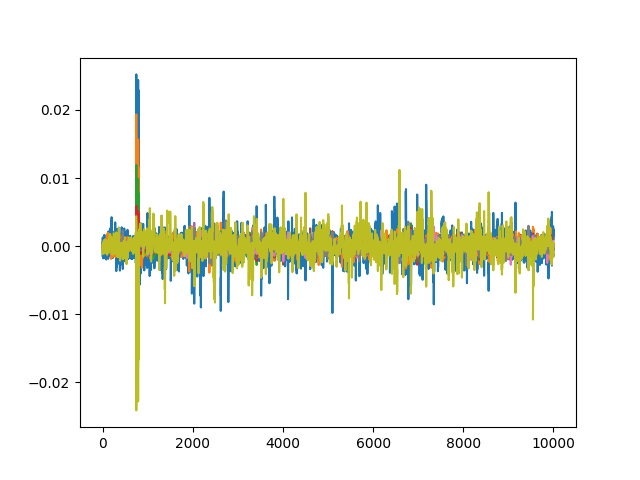

In [415]:
import time

hw_groups = [[], [], [], [], [], [], [], [], []]

for tnum in range(len(trace_array)):
#     print(key_array[tnum][0])
    hw_of_byte = HW[key_array[tnum][0]]
    hw_groups[hw_of_byte].append(trace_array[tnum])
    
hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
avg_trace = np.average(hw_averages, axis=0)

fig = plt.figure()

for hw in range(9):
    time.sleep(0.5)
    plt.plot(hw_averages[hw]-avg_trace)
    fig.canvas.draw()

## 取每個roundkey的第一個byte做hamming weight分析

<IPython.core.display.Javascript object>


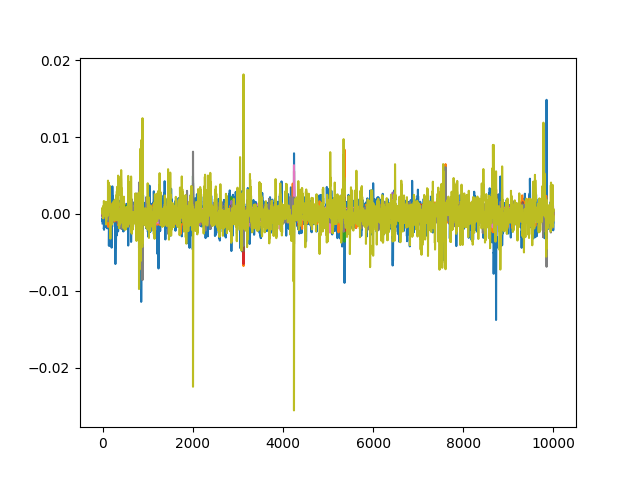

<IPython.core.display.Javascript object>


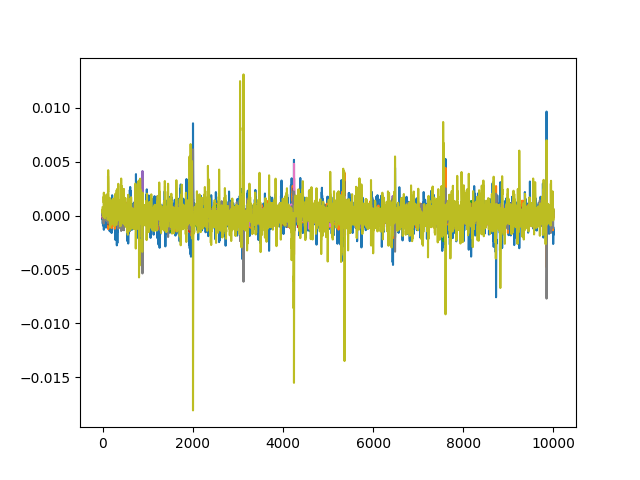

<IPython.core.display.Javascript object>


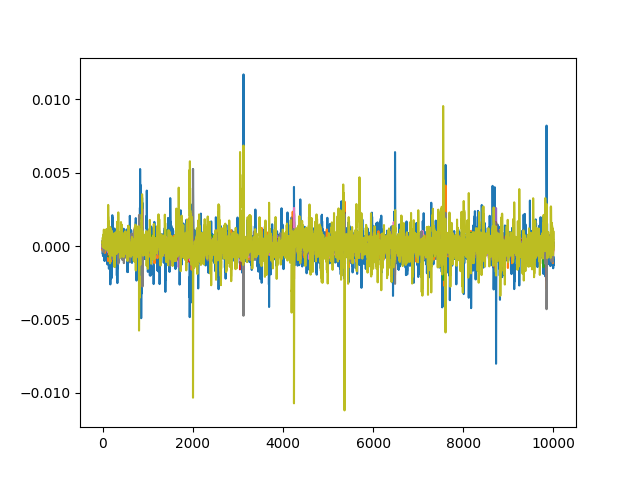

<IPython.core.display.Javascript object>


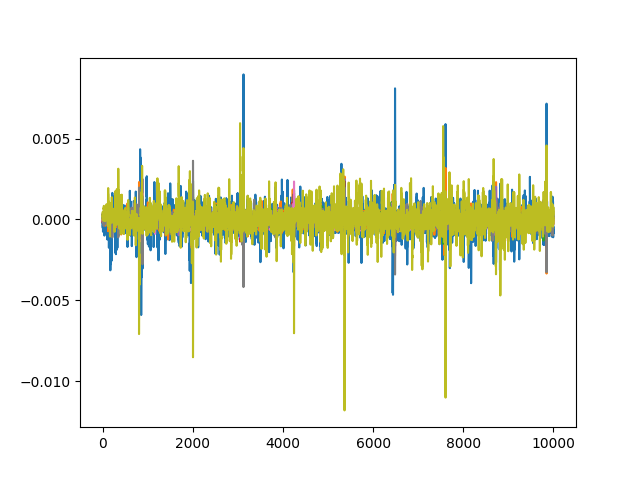

<IPython.core.display.Javascript object>


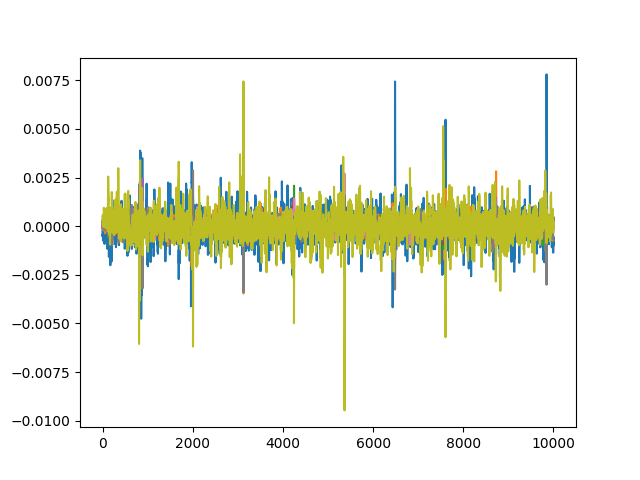

<IPython.core.display.Javascript object>


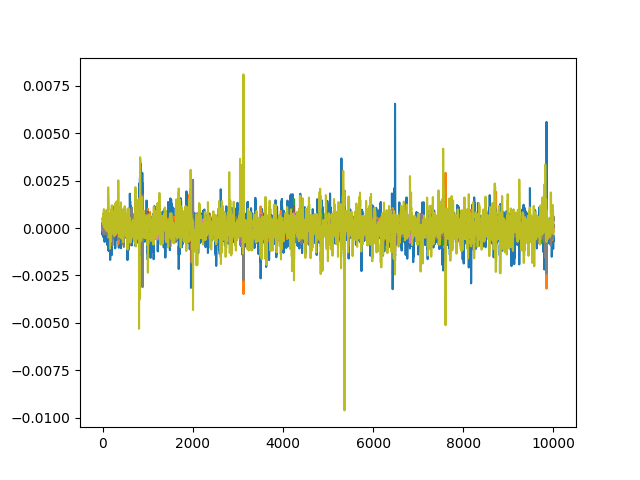

<IPython.core.display.Javascript object>


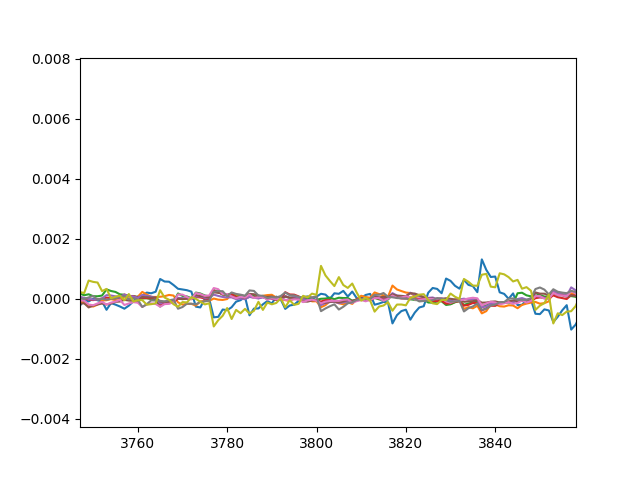

<IPython.core.display.Javascript object>


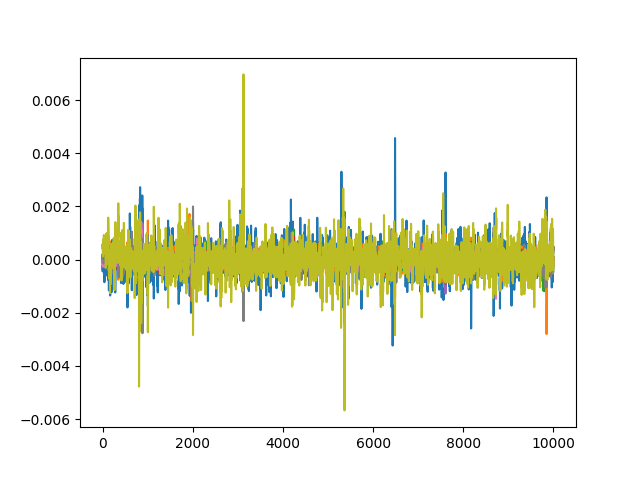

<IPython.core.display.Javascript object>


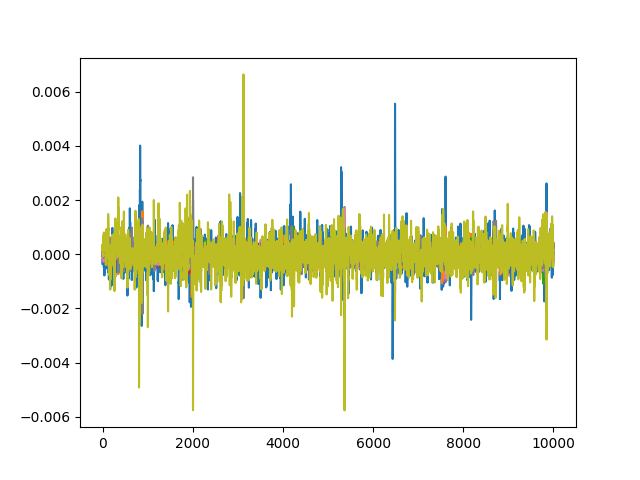

In [115]:
import time

hw_groups = [[], [], [], [], [], [], [], [], []]
fig=[]

for i in range(9):
    for tnum in range(len(trace_array)):
    #     print(round_key[tnum][0])
        hw_of_byte = HW[round_key[tnum][i][0]]
        hw_groups[hw_of_byte].append(trace_array[tnum])

    hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
    avg_trace = np.average(hw_averages, axis=0)


    fig.append(plt.figure())

    for hw in range(9):
        time.sleep(0.5)
        plt.plot(hw_averages[hw]-avg_trace)
        fig[i].canvas.draw()

<IPython.core.display.Javascript object>


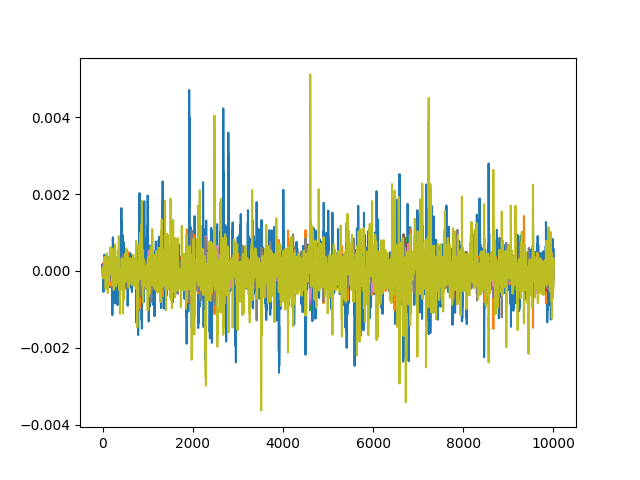

<IPython.core.display.Javascript object>


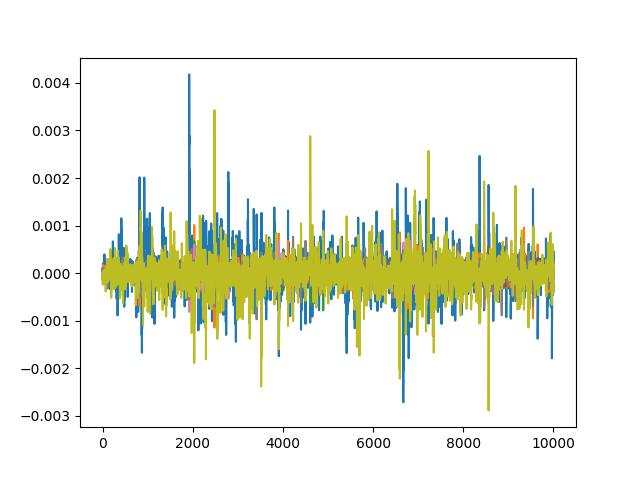

<IPython.core.display.Javascript object>


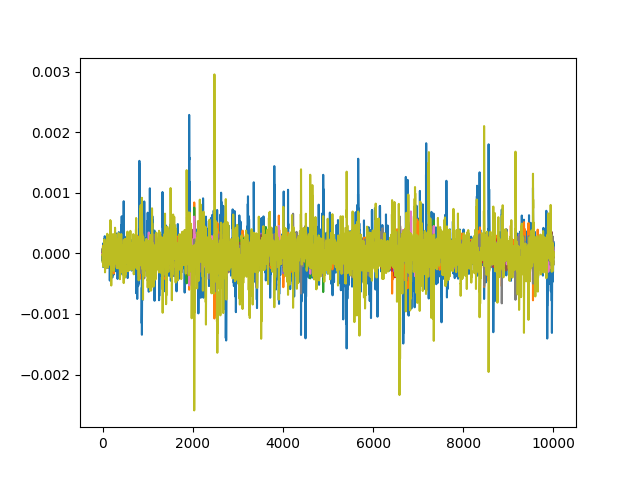

<IPython.core.display.Javascript object>


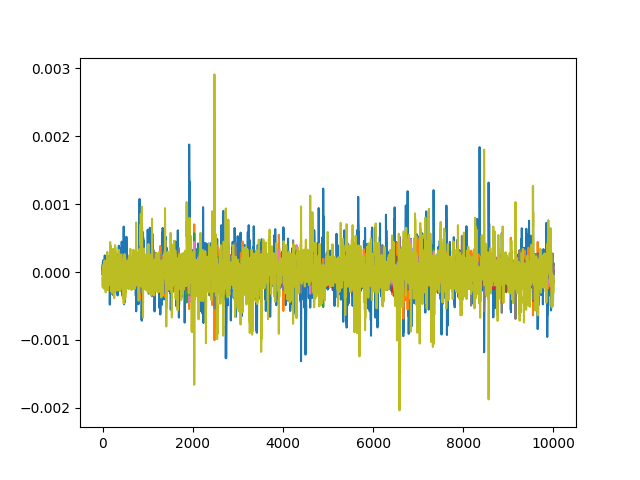

<IPython.core.display.Javascript object>


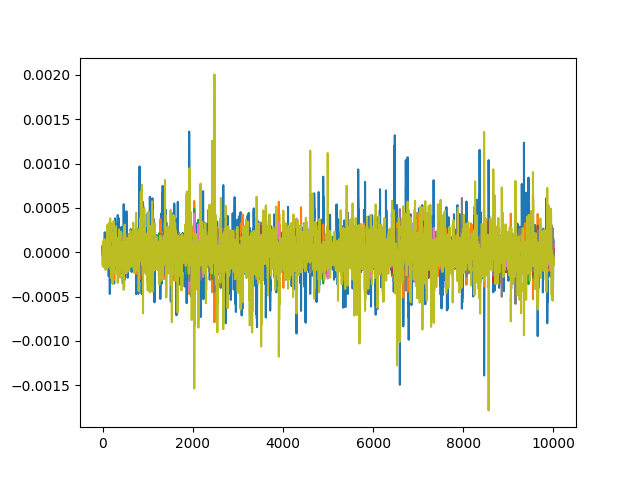

<IPython.core.display.Javascript object>


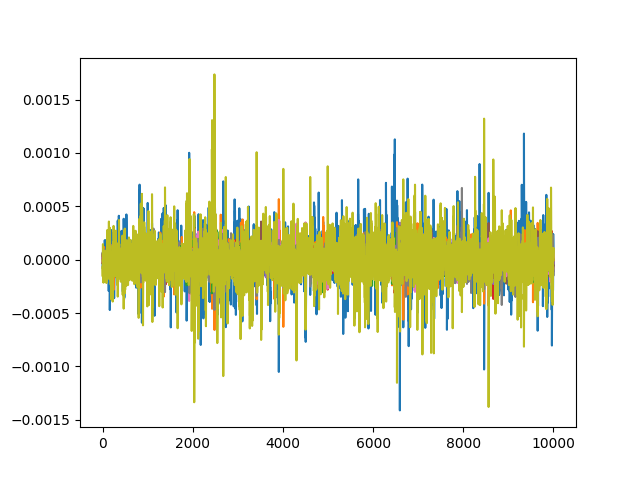

<IPython.core.display.Javascript object>


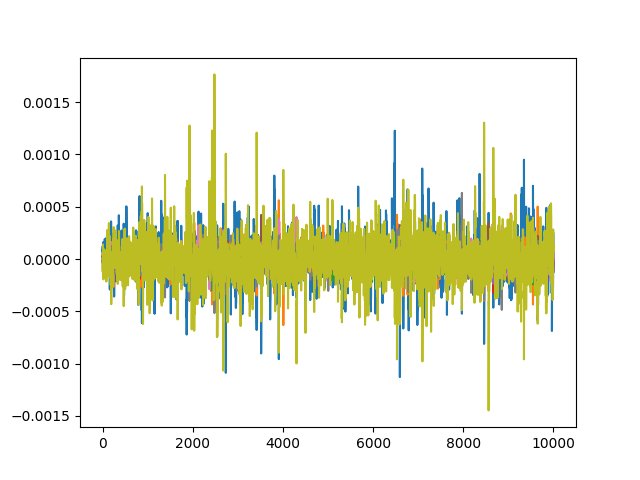

<IPython.core.display.Javascript object>


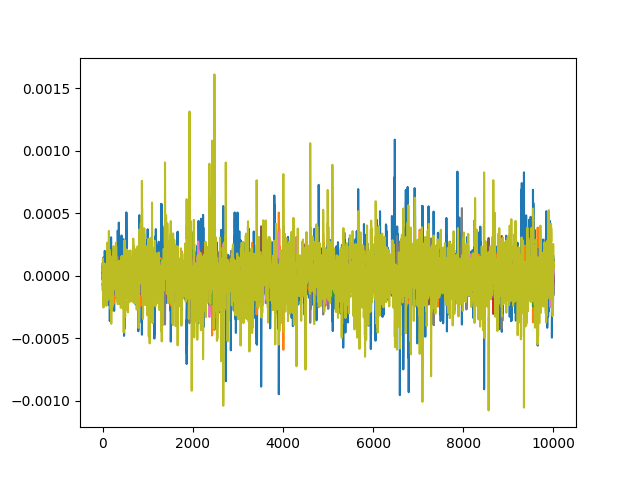

<IPython.core.display.Javascript object>


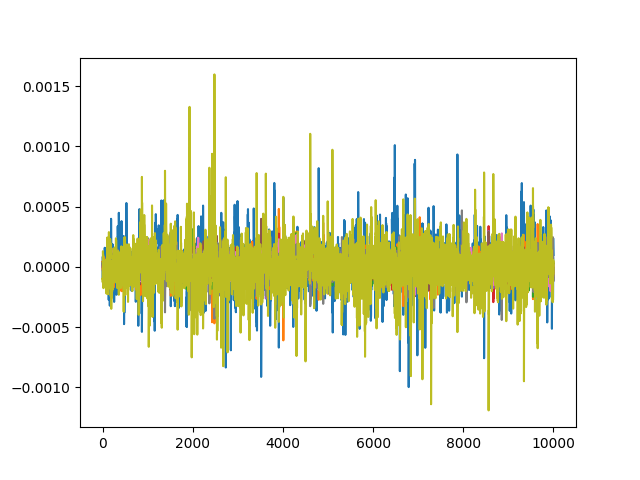

In [69]:
import time

hw_groups = [[], [], [], [], [], [], [], [], []]
fig=[]

for i in range(9):
    for tnum in range(len(trace_array)):
    #     print(round_key[tnum][0])
        hw_of_byte = HW[round_key[tnum][i][0]]
        hw_groups[hw_of_byte].append(trace_array[tnum].wave)

    hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
    avg_trace = np.average(hw_averages, axis=0)


    fig.append(plt.figure())

    for hw in range(9):
        time.sleep(0.5)
        plt.plot(hw_averages[hw]-avg_trace)
        fig[i].canvas.draw()



In [114]:
ana_group=[]
hw_groups = [[], [], [], [], [], [], [], [], []]
fig=[]

for i in (0, 4, 8, 12):
    for tnum in range(len(trace_array)):
    #     print(round_key[tnum][0])
        hw_of_byte = HW[round_key[tnum][0][i]]
        hw_groups[hw_of_byte].append(trace_array[tnum].wave)

    hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
    avg_trace = np.average(hw_averages, axis=0)
    ana_group.append(hw_averages)


for tnum in range(len(trace_array)):
#     print(round_key[tnum][0])
    hw_of_byte = HW[round_key[tnum][1][0]]
    hw_groups[hw_of_byte].append(trace_array[tnum].wave)

hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
avg_trace = np.average(hw_averages, axis=0)
ana_group.append(hw_averages)



In [121]:
for i in (0, 4, 8, 12):
    for tnum in range(len(trace_array)):
    #     print(round_key[tnum][0])
        hw_of_byte = HW[round_key[tnum][1][i]]
        hw_groups[hw_of_byte].append(trace_array[tnum].wave)

    hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
    avg_trace = np.average(hw_averages, axis=0)
    ana_group.append(hw_averages)


for tnum in range(len(trace_array)):
#     print(round_key[tnum][0])
    hw_of_byte = HW[round_key[tnum][2][0]]
    hw_groups[hw_of_byte].append(trace_array[tnum].wave)

hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
avg_trace = np.average(hw_averages, axis=0)
ana_group.append(hw_averages)

In [146]:
from tqdm.notebook import tnrange

ana_group=[]

fig=[]


for k in  tnrange(10, desc='round key'):
    hw_groups = [[], [], [], [], [], [], [], [], []]
    for i in tnrange(0, 12, 4, desc='byte', leave=False): #0 4 8 12
        
        for tnum in  tnrange(len(trace_array), desc='trace array', leave=False):
        #     print(round_key[tnum][0])
            hw_of_byte = HW[round_key[tnum][k][i]]
            hw_groups[hw_of_byte].append(trace_array[tnum].wave)

        hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
        ana_group.append(hw_averages)

    
    for tnum in tnrange(len(trace_array), desc='trace array2', leave=False):
    #     print(round_key[tnum][0])
        hw_of_byte = HW[round_key[tnum][(k+1)%10][0]]
        hw_groups[hw_of_byte].append(trace_array[tnum].wave)

    hw_averages = np.array([np.average(hw_groups[hw], axis=0) for hw in range(9)])
    ana_group.append(hw_averages)

round key:   0%|          | 0/10 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

byte:   0%|          | 0/3 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array:   0%|          | 0/100000 [00:00<?, ?it/s]

trace array2:   0%|          | 0/100000 [00:00<?, ?it/s]

In [147]:
len(ana_group)

40

In [148]:
ana_averages=[]
# ana_averages = np.array([np.average((ana_group[byte][hw] for byte in range(5))for hw in range(9)) ])
for hw in range(9):
    temp=[]
    for i in range(40):
        temp.append(ana_group[i][hw])
    ana_averages.append(np.array(np.average(temp, axis=0)))
len(ana_averages)

9

<IPython.core.display.Javascript object>


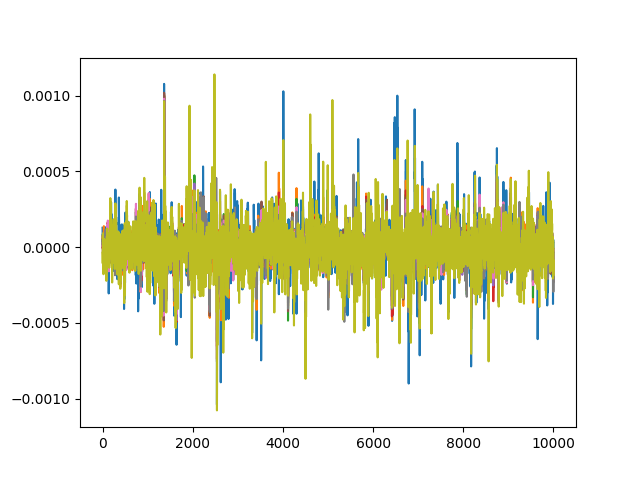

In [149]:
fig = plt.figure()

for hw in range(9):
    time.sleep(0.5)
    plt.plot(ana_averages[hw]-avg_trace)
    fig.canvas.draw()

# 測試key在不同產生條件下的Hamming Weight分佈

In [70]:
candidate_keypart=bytearray([0x0, 0x1, 0x3, 0x7, 0xf])

In [62]:
import random


def key_gen():
    temp_key=bytearray([])
    for i in range(16):
        temp_key.append((random.choice(candidate_keypart))*16+random.choice(candidate_keypart))
        
    return temp_key


key_gen()

CWbytearray(b'f0 31 ff 31 0f f1 f1 31 00 10 01 71 33 71 00 1f')

In [71]:
test_key=[]
test_hw_groups = [0, 0, 0, 0, 0, 0, 0, 0, 0]

for i in range(10000):
    key=key_gen()
    test_key.append(key)
    
len(test_key)
    

10000

In [72]:
for i in range(10000):
    hw_of_byte = HW[test_key[i][0]]
    test_hw_groups[hw_of_byte] = test_hw_groups[hw_of_byte] + 1

In [73]:
for i in range(9):
    print(test_hw_groups[i])

385
718
1151
1653
1993
1686
1207
820
387


# Random小機率出現的情況

## Hamming weight 部分因為出現機率較小所以為0

In [309]:
for i in range(9):
    print(len(hw_groups[i]))

2
45
104
209
270
224
114
32
0


In [301]:
scope.dis()
target.dis()